In [1]:
from os import chdir,getcwd,listdir,rename
home = getcwd()

import random
import wx
import pandas as pd
import numpy as np
from scipy.stats import linregress
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.cm as cm
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
from FlowCytometryTools import FCMeasurement,FCPlate, ThresholdGate,PolyGate

plt.style.use('seaborn-talk')
plt.rc('xtick', labelsize='medium')
plt.rc('ytick', labelsize='medium')
plt.rcParams['axes.facecolor']= 'white'
%matplotlib inline

In [2]:
def load_data(folder,channels = ['SSC-A','FSC-A']):
    def linear(x,d=1):
        print d
        return x
    def get_data(folder):
        chdir(folder)
        #Formatting File names for FCPlate Parser Import
        files = [x for x in listdir(getcwd()) if x[-3:] == 'fcs']
        try:
            files.remove('.DS_Store')
        except:
            pass
        for i,name in enumerate(files):
            if name[-6] == '0':
                newname = folder + '_Well_' + name[-7] + name[-5] + '_' + name[-7:-4] + name[-4:]
            else:
                newname = folder + '_Well_' + name[-7:-4] + '_' + name[-7:-4] + name[-4:]
            rename(name,newname)
            files[i] = newname
        data = FCPlate.from_files(ID = folder, datafiles = files,parser = 'name')
        #data = data.transform('hlog',channels = channels)
        data = data.transform(linear,channels = channels)
        print '%s Data Loaded!'%(data.ID)
        chdir('..')
        return data
    
    if type(folder) == str:
        data = get_data(folder)
    elif type(folder) == list and len(folder) == 1:
        data = get_data(folder[0])
    else:
        data = []
        for f in folder:
            data.append(get_data(f))
    return data

def load_platemap(path):
    xlsx = pd.ExcelFile(path)
    platemaps =[]
    for i in range(len(xlsx.sheet_names)):
        df = xlsx.parse(i,index_col=1,skiprows=1)
        drop =[]
        for col in df.columns:
            try:
                if int(col) not in range(1,13):
                    drop.append(col)
            except:
                drop.append(col)
        df.drop(drop,axis=1,inplace=True)
        df.columns=df.columns.astype(int)
        platemaps.append(df.loc['A':'H',1:12])
    if len(platemaps) == 1:
        return platemaps[0]
    else:
        return platemaps

In [3]:
ls

 Volume in drive C is OS
 Volume Serial Number is F855-B753

 Directory of C:\Users\albif\Dropbox\Experimental work\Experimental data - cytometry\Pattern formation\Per strain\20-08-13 MoreData2

08/17/2020  10:25 AM    <DIR>          .
08/17/2020  10:25 AM    <DIR>          ..
08/17/2020  10:25 AM    <DIR>          .ipynb_checkpoints
08/14/2020  01:51 PM         2,489,461 20-08-13 MoreData2 BAR1 Time2.c6
08/14/2020  03:47 PM         6,645,403 20-08-13 MoreData2 BAR1 Time3.c6
08/14/2020  11:06 AM         5,880,326 20-08-13 MoreData2 Time0.c6
08/14/2020  08:55 PM        32,910,190 20-08-13 MoreData2 Time1.c6
08/13/2020  09:22 PM         5,292,979 20-08-13 MoreData2Sampling1.c6
08/14/2020  09:44 AM         5,832,304 20-08-13 MoreData2Sampling2.c6
08/10/2020  12:22 PM         1,649,990 Cytometry Data Analysis.ipynb
08/17/2020  10:24 AM            17,937 platemap.xlsx
08/17/2020  10:01 AM    <DIR>          Time0
08/17/2020  10:01 AM    <DIR>          Time1
08/17/2020  10:02 AM    <DIR>     

In [4]:
#Load data and platemap
folders = ['Time0','Time1','Time3BAR1']
platemap = load_platemap('platemap.xlsx')
data = load_data(folders,channels = ['SSC-A','FSC-A','SSC-H','FSC-H','FL1-A'])
platemap

1
Time0 Data Loaded!
1
Time1 Data Loaded!
1
Time3BAR1 Data Loaded!


[                                        1   \
 A   beta->IAA + IAA-|2xGFP_rep1,IAM300uM,0   
 B   beta->IAA + IAA-|2xGFP_rep3,IAM300uM,0   
 C        beta-|BAR1 + alpha-|GFP,control,0   
 D  IAA->alpha(ZAVN) + alpha-|GFP,control,0   
 E  beta->alpha + alpha-|GFP_rep3,beta1nM,0   
 F                                      NaN   
 G                                      NaN   
 H                                      NaN   
 
                                                  2   \
 A  beta->IAA + IAA-|2xGFP_rep1,IAM300uM+beta0.1nM,0   
 B  beta->IAA + IAA-|2xGFP_rep3,IAM300uM+beta0.1nM,0   
 C              beta-|BAR1 + alpha-|GFP,alpha200nM,0   
 D          IAA->alpha(ZAVN) + alpha-|GFP,IAA500nM,0   
 E           beta->alpha + alpha-|GFP_rep3,beta5nM,0   
 F                                               NaN   
 G                                               NaN   
 H                                               NaN   
 
                                                3   \
 A  beta->IAA +

In [5]:
def set_gates(channels,limits,poly=False,gates={}):
    if isinstance(channels,list):
        if isinstance(limits[0],list) or isinstance(limits[0],tuple):
            if poly == True:
                for i,ch in enumerate(channels):
                    gates[ch] = []
                    for limit in limits:
                        gates[ch].append(limit)
            else:
                for i,ch in enumerate(channels):
                    gates[ch] = [limits[i][0],limits[i][1]]
            return gates 
        else:
            print 'Error: Limits Incorrectly Formatted, limits should be passed as a list of 2D arrays [[lim1_low,lim1_high]...]'
    
def get_threshold(channels,gates,poly=False):
    if not poly:
        return ThresholdGate(gates[channels][0], channels,region ='above') & ThresholdGate(gates[channels][1], channels,region ='below') 
    else:
        return PolyGate(gates[channels],channels)

In [6]:
# Set Gates Using GUI
# after Creating the gate make sure to exit out of the GUI, otherwise the rest of the scripts won't run
trim=set_gates(channels = ['FSC-H','SSC-A'],limits =[(0,5*10**6),(0,.6*10**6)],gates={})
trim_threshold = get_threshold('SSC-A',trim) & get_threshold('SSC-A',trim)
data['A1'].gate(trim_threshold).view_interactively(backend='wx')

TypeError: list indices must be integers, not str

In [7]:
#Set Gates
# make sure to set the PolyGate region to 'in'
#fsc_ssc_gate= PolyGate([(1.470e+06, 1.976e+05), (6.652e+05, 1.097e+05), (7.457e+05, 4.141e+04), (1.084e+06, 3.164e+04), (2.098e+06, 9.218e+04), (2.790e+06, 1.605e+05), (2.532e+06, 2.367e+05), (1.470e+06, 1.976e+05)], ('FSC-H', 'SSC-A'), region='in', name='gate1')
fsc_ssc_gate=PolyGate([(3.904e+05, 2.610e+04), (8.595e+05, 2.189e+04), (1.785e+06, 9.860e+04), (2.081e+06, 2.278e+05), (1.156e+06, 2.373e+05), (3.284e+05, 6.077e+04), (3.284e+05, 6.077e+04), (3.992e+05, 2.295e+04), (3.948e+05, 2.400e+04), (3.948e+05, 2.400e+04), (3.948e+05, 2.400e+04)], ('FSC-A', 'SSC-A'), region='in', name='gate1')
# PolyGate([(8.133e+05, 9.116e+04), (9.293e+05, 2.085e+05), (1.652e+06, 2.008e+05), (1.458e+06, 8.346e+04), (8.262e+05, 8.346e+04)], ('FSC-H', 'SSC-A'), region='in', name='gate1')
fsc_ssc_threshold = fsc_ssc_gate
fl1_gate = set_gates(channels = ['FL1-A'],limits =[(3000,5*10**7)],gates={})
fl1_threshold = get_threshold('FL1-A',fl1_gate)

In [8]:
def plot_gate(gate,ax=plt):
    xCoord = []
    yCoord = []
    for point in gate.vert:
        xCoord.append(point[1])
        yCoord.append(point[0])
    ax.plot(xCoord, yCoord, color='black', marker='o', linestyle='solid', linewidth=2, markersize=2)

def plot_Hist(data,channel='FL1-A',trim=None,gate=None,platemap=None):
    def Hist(df,pmap=None):
        if trim != None:
            df = df.gate(trim)
        for well in sorted(df):
            plt.figure()
            bins=10**(np.linspace(2,6,100))
            plt.xscale('log')
            df[well].plot(channel,bins=bins,label=channel)
            if type(gate) != type(None):
                df[well].gate(gate).plot(channel,bins= bins,color='g',label='Gated')
            if type(pmap) != type(None):
                plt.title(str(pmap.loc[well[0],int(well[1:])]))
            else:
                plt.title(well)
            plt.legend(loc='center left',bbox_to_anchor=(1,.5))
            plt.show()
            plt.close()
            
    if type(data) == list:
        Hist(data[0], platemap[0])
        for i,df in enumerate(data):
            Hist(df,platemap[i])  
    else:
        Hist(data,platemap)
      
def plot_Hist2D(data,channels=('FSC-H','SSC-A'),rows=5,size_unit=15,trim=None,gate=None):
    def Hist2D(df):
        if len(df)/float(rows)-int(len(df)/float(rows))>0:
            cols=int(len(df)/rows)+1
        else:
            cols=len(df)/rows
        if cols/rows*size_unit ==0 :
            fig,ax=plt.subplots(cols,rows,figsize=(size_unit,size_unit/2.5),sharey=True,sharex=True)
        else :
            fig,ax=plt.subplots(cols,rows,figsize=(size_unit,cols/rows*size_unit),sharey=True,sharex=True)
        j=0
        for i,well in enumerate(sorted([(x[0],int(x[1:]))for x in df])):
            well = well[0]+str(well[1])
            if trim != None:
                param1 = df.gate(trim)[well][channels[0]]
                param2 = df.gate(trim)[well][channels[1]]
            else:
                param1 = df[well][channels[0]]
                param2 = df[well][channels[1]]
                print(ax[j][i%rows])
            ax[j][i%rows].hist2d(param2,param1,bins=100, norm = LogNorm(),cmap = plt.cm.jet)
#             ax[j][i%rows].hist2d(param1,param2,bins=100, norm = LogNorm(),cmap = plt.cm.jet)
            #ax[j][i%rows].text(.5*10**6,5*10**5,well,weight='bold',fontsize=12*size_unit/10.0)
            if gate != None:
                plot_gate(gate,ax=ax[j][i%rows])
            if (i+1) % rows ==0:
                j+=1
        ylims = ax[0][i%rows].get_ylim()
        ax[0][i%rows].set_yticks(ylims)
        xlims = ax[0][i%rows].get_xlim()
        ax[0][i%rows].set_xticks(xlims)
        #ax[j][i%rows].set_xticks([])
        #ax[j][i%rows].set_yticks([])
        fig.text(.5,-0.01,channels[0],weight='bold',fontsize=12*size_unit/10.0)
        fig.text(-0.01,.5,channels[1],rotation='vertical',weight='bold',fontsize=12*size_unit/10.0)
        plt.tight_layout()
        plt.show()
        plt.close()
    
    if type(data) == list:
        for df in data:
            Hist2D(df)       
    else:
        Hist2D(data)

In [9]:
#Plot single gate for testing
data['E5'].gate(trim_threshold).plot(['FSC-H','SSC-A'], gates=fsc_ssc_gate, bins=100,cmap=cm.Oranges)

TypeError: list indices must be integers, not str

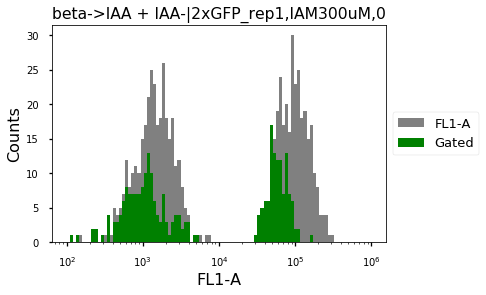

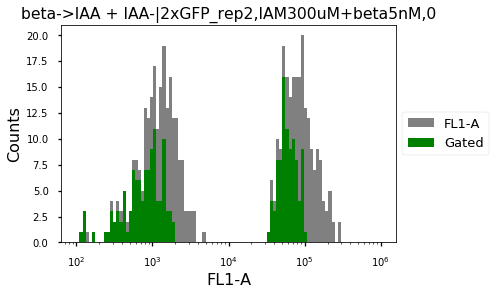

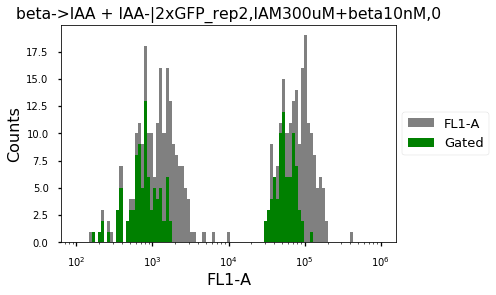

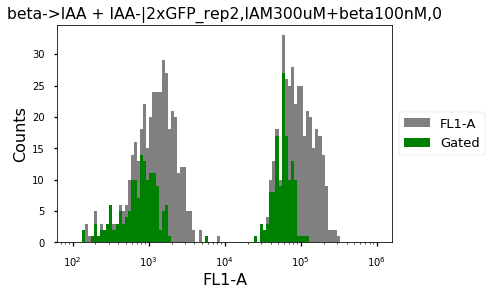

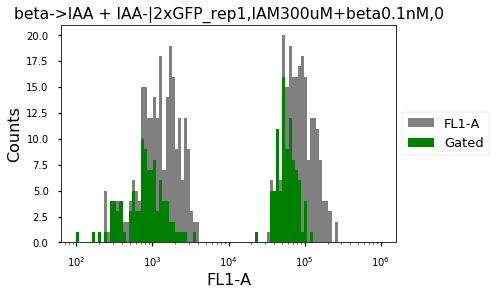

...

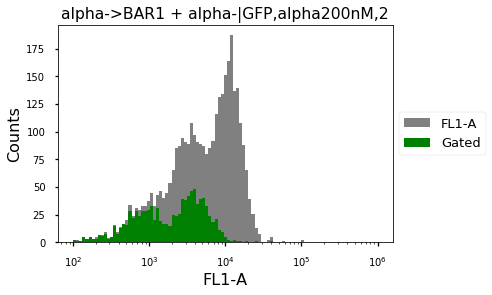

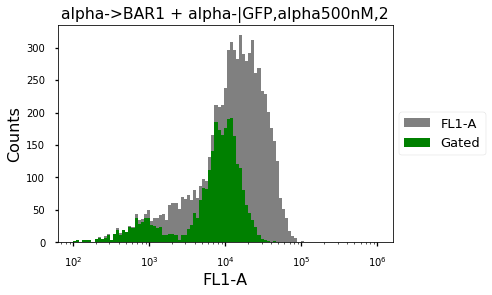

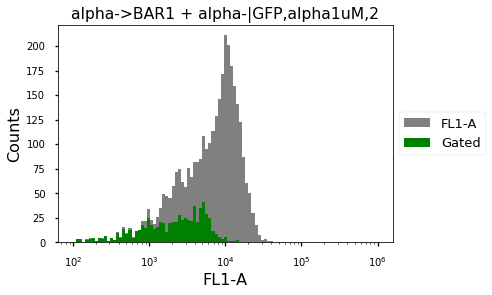

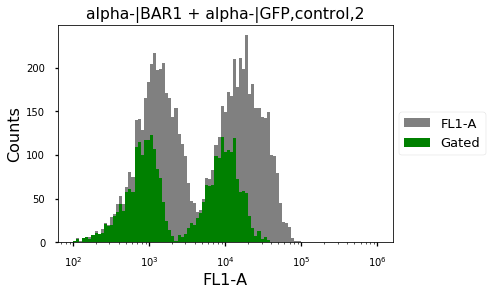

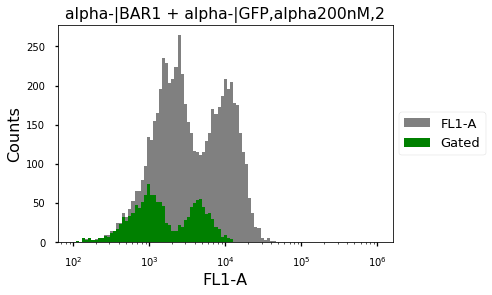

In [10]:
# Plot FL1-A histrogram with gating
plot_Hist(data,trim=trim_threshold,platemap=platemap,gate=fsc_ssc_threshold)   
# plot_Hist(data,trim=trim_threshold,platemap=platemap)  

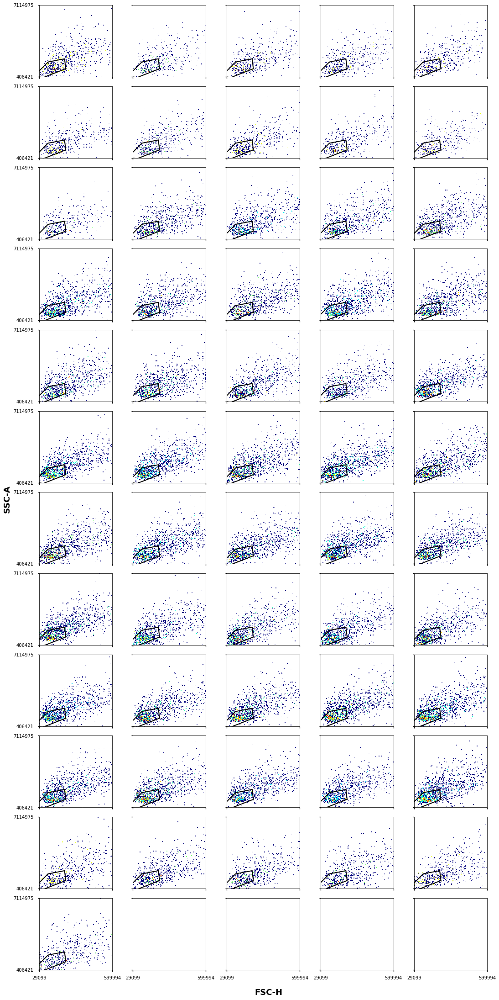

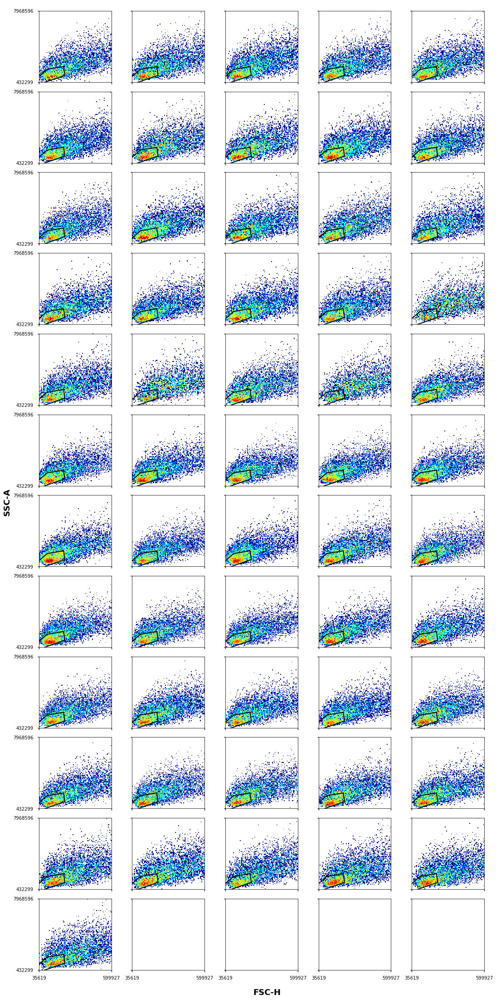

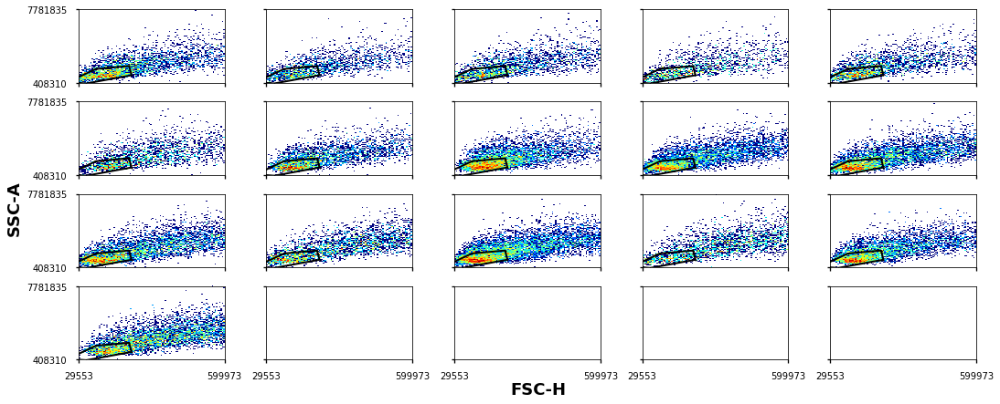

In [11]:
#Plot 2D Histograms for all samples with gating
plot_Hist2D(data,trim=trim_threshold,gate=fsc_ssc_gate)

In [12]:
def median_FL1(well):
    #Calculates median fluorescence
    return well.get_data()['FL1-A'].median()

def event_rate(well):
    #Calculates concentration as events/second
    evs = float(len(well.get_data().index))
    net_hrs=0
    for i,(t1,t2) in enumerate(zip(well.get_meta()['$BTIM'].split(':'),well.get_meta()['$ETIM'].split(':'))):
        net_hrs+=(float(t2)-float(t1))/(60.0**i)
    return evs/(net_hrs*60**2)

def normalize(well):
    data = well.get_data()['FL1-A']/well.get_data()['FSC-A']
    return data.median()

def abs_time(well):
    #Calculates absolute time in hours 
    hrs = 0
    for i,t in enumerate(well.get_meta()['$ETIM'].split(':')):
        hrs+=float(t)/(60.0**i)
    date = pd.to_datetime(well.get_meta()['$DATE'])
    hrs+=(date.year-1)*360*24+(date.month-1)*30*24+(date.day-1)*24
    return hrs

def analyze(data,func,gate=None):
    if type(data) == list:
        results = [] 
        for df in data:
            if gate == None:
                results.append(df.apply(func))
            else:
                results.append(df.gate(gate).apply(func))
    else:
        if gate == None:
            results = data.apply(func)
        else:
            results = data.gate(gate).apply(func)
    return results
            

In [13]:
#Calculate parameter data
gate = fsc_ssc_threshold&fl1_threshold
#gate = fsc_ssc_threshold
fl1 = analyze(data,median_FL1,gate=gate)
#conc = analyze(data,event_rate,gate=gate)
time = analyze(data,abs_time,gate=gate)
#fl1 = analyze(data,median_FL1)
conc = analyze(data,event_rate)
normalized_fl1 = analyze(data, normalize, gate=gate)
#time = analyze(data,abs_time)
conc

[          1          2          3          4          5          6   \
 A  29.800363  22.600733  24.542079  24.266338  22.877960  24.484629   
 B  51.818182  45.163636  47.992937  52.472727  47.527273  47.688504   
 C  51.992687  54.232836  61.886336  57.533253  65.430874  63.652174   
 D  52.829721  52.610837  55.149254  50.906832  53.740085  53.558504   
 E  57.481203  60.644753  30.997442  30.436364  30.954955  27.927273   
 F        NaN        NaN        NaN        NaN        NaN        NaN   
 G        NaN        NaN        NaN        NaN        NaN        NaN   
 H        NaN        NaN        NaN        NaN        NaN        NaN   
 
           7          8          9          10         11         12  
 A  25.353160  23.992560  21.404806  20.921053  18.029197  44.727273  
 B  53.345455  49.527273  50.652174  44.770642  41.052632  43.686806  
 C  62.945455  66.457074  64.870849  57.963636  57.752266  56.893438  
 D  59.330855  61.423221  73.700495  72.889447  59.814011  50.1090

In [14]:
def map_data(platemap,params,index_name):
    if type(platemap) == list:
        for k in range(len(platemap)):
            ids= platemap[k].unstack().dropna()
            index = [tuple([x if x[0].isalpha() or 'I' in x else float(x) for x in i.split(',')]) if not pd.isnull(i) else (None,0) for i in ids]
            wells = [(i[1],int(i[0]))for i in ids.index]
            if k == 0:
                mapped = pd.DataFrame(data=[[params[key][k].loc[well[0],well[1]] for key in params] for well in wells],index = pd.MultiIndex.from_tuples(index),columns=[key for key in params])
                mapped.sort_index(inplace=True)
            else:
                temp =pd.DataFrame(data=[[params[key][k].loc[well[0],well[1]] for key in params] for well in wells],index = pd.MultiIndex.from_tuples(index),columns=[key for key in params])
                temp.sort_index(inplace=True)
                mapped =mapped.append(temp)
    elif type(platemap) == pd.core.frame.DataFrame:
        ids= platemap.unstack().dropna()
        index = [tuple([x if x[0].isalpha() else float(x) for x in i.split(',')]) if not pd.isnull(i) else (None,0) for i in ids]
        wells = [(i[1],int(i[0]))for i in ids.index]
        mapped = pd.DataFrame(data=[[params[key].loc[well[0],well[1]] for key in params] for well in wells],index = pd.MultiIndex.from_tuples(index),columns=[key for key in params])
    else:
        print 'ERROR: Your platemap appears to be neither a list of DataFrames or a DataFrame....'
        return None
    mapped.index = mapped.index.set_names(index_name)
    mapped.sort_index(level = 0,inplace=True)
    return mapped

In [15]:
print(platemap)

[                                        1   \
A   beta->IAA + IAA-|2xGFP_rep1,IAM300uM,0   
B   beta->IAA + IAA-|2xGFP_rep3,IAM300uM,0   
C        beta-|BAR1 + alpha-|GFP,control,0   
D  IAA->alpha(ZAVN) + alpha-|GFP,control,0   
E  beta->alpha + alpha-|GFP_rep3,beta1nM,0   
F                                      NaN   
G                                      NaN   
H                                      NaN   

                                                 2   \
A  beta->IAA + IAA-|2xGFP_rep1,IAM300uM+beta0.1nM,0   
B  beta->IAA + IAA-|2xGFP_rep3,IAM300uM+beta0.1nM,0   
C              beta-|BAR1 + alpha-|GFP,alpha200nM,0   
D          IAA->alpha(ZAVN) + alpha-|GFP,IAA500nM,0   
E           beta->alpha + alpha-|GFP_rep3,beta5nM,0   
F                                               NaN   
G                                               NaN   
H                                               NaN   

                                               3   \
A  beta->IAA + IAA-|2xGFP_rep1,IAM3

In [16]:
#Map Data to Identifier as MultiIndex
mapped = map_data(platemap,{'Median FL1-A':fl1, 'Normalized Median Fluorescence': normalized_fl1, 'Event Rate':conc,'Time':time},['Strain','Treatment','t'])

mapped['Time'] -= min(mapped['Time'])
mapped

Normalized Median Fluorescence  \
Strain                        Treatment             t                                     
IAA->alpha(ZAVN) + alpha-|GFP IAA10uM               0.0                        0.007259   
                                                    1.0                        0.006853   
                              IAA500nM              0.0                        0.007523   
                                                    1.0                        0.006788   
                              IAA5uM                0.0                        0.007602   
                                                    1.0                        0.006665   
                              control               0.0                        0.007227   
                                                    1.0                        0.006727   
IAA-|2xGFP                    IAA500nM              0.0                        0.057065   
                                                    1.0                        0.029148   
                              IAA500nM+auxinol100uM 0.0                        0.054937   
                                                    1.0                        0.033207   
                              IAA500nM+auxinol10uM  0.0                        0.055648   
                                                    1.0                        0.029792   
                              IAA500nM+auxinol50uM  0.0                        0.054237   
                                                    1.0                        0.031380   
                              IAA5uM                0.0                        0.057514   
                                                    1.0                        0.014132   
                              control               0.0                        0.054958   
                                                    1.0                        0.040020   
alpha->2xGH3 + IAA-|2xGFP     IAA100nM              0.0                        0.043372   
                                                    1.0                        0.037173   
                              IAA500nM              0.0                        0.044198   
                                                    1.0                        0.027512   
                              alpha1uM              0.0                        0.041974   
                                                    1.0                        0.042772   
                              alpha1uM+IAA100nM     0.0                        0.041817   
                                                    1.0                        0.035019   
                              alpha1uM+IAA500nM     0.0                        0.042906   
                                                    1.0                        0.024508   
...                                                                                 ...   
beta->IAA + IAA-|2xGFP_rep3   IAM300uM+beta1nM      0.0                        0.043729   
                                                    1.0                        0.030543   
                              IAM300uM+beta5nM      0.0                        0.041903   
                                                    1.0                        0.027733   
beta->alpha + alpha-|GFP      control               0.0                        0.007758   
                                                    1.0                        0.008232   
beta->alpha + alpha-|GFP_rep1 beta0.1nM             0.0                        0.007553   
                                                    1.0                        0.008163   
                              beta1nM               0.0                        0.007336   
                                                    1.0                        0.004393   
                              beta5nM               0.0                        0.007236   
                                                    1

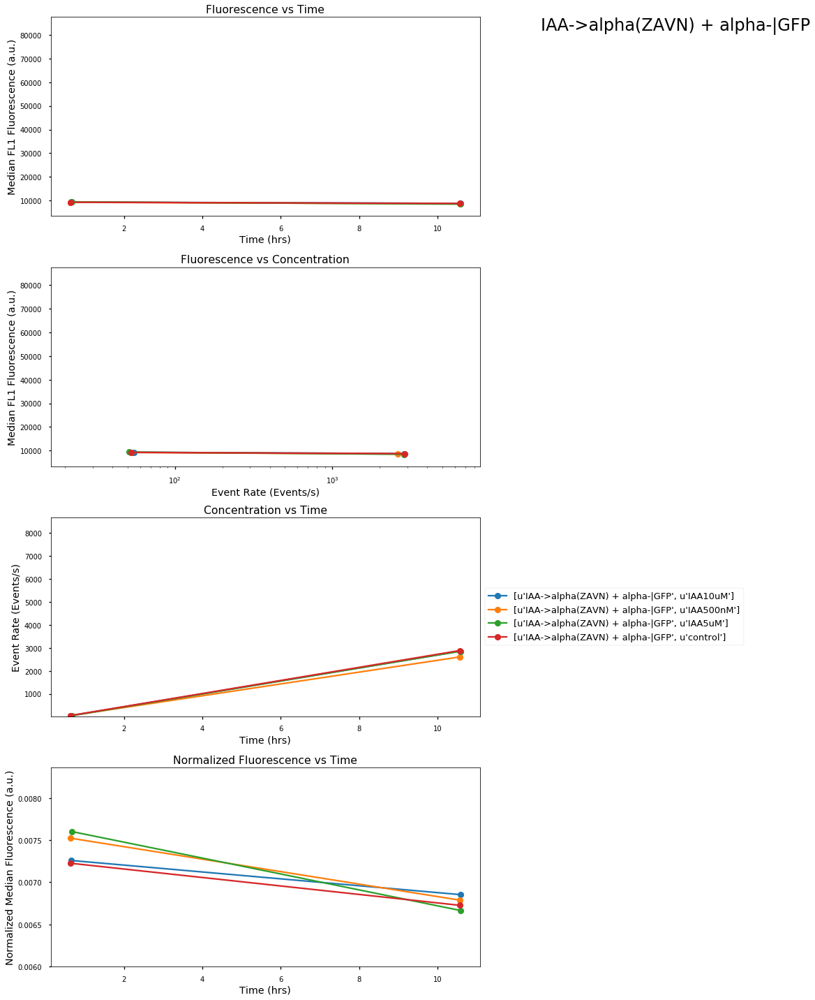

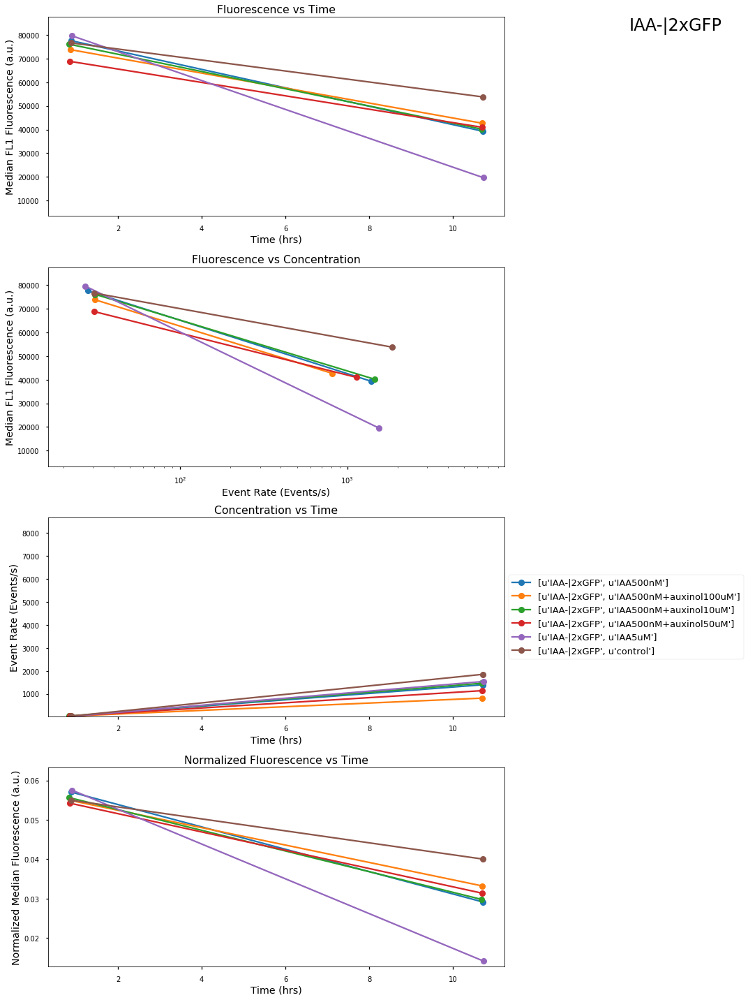

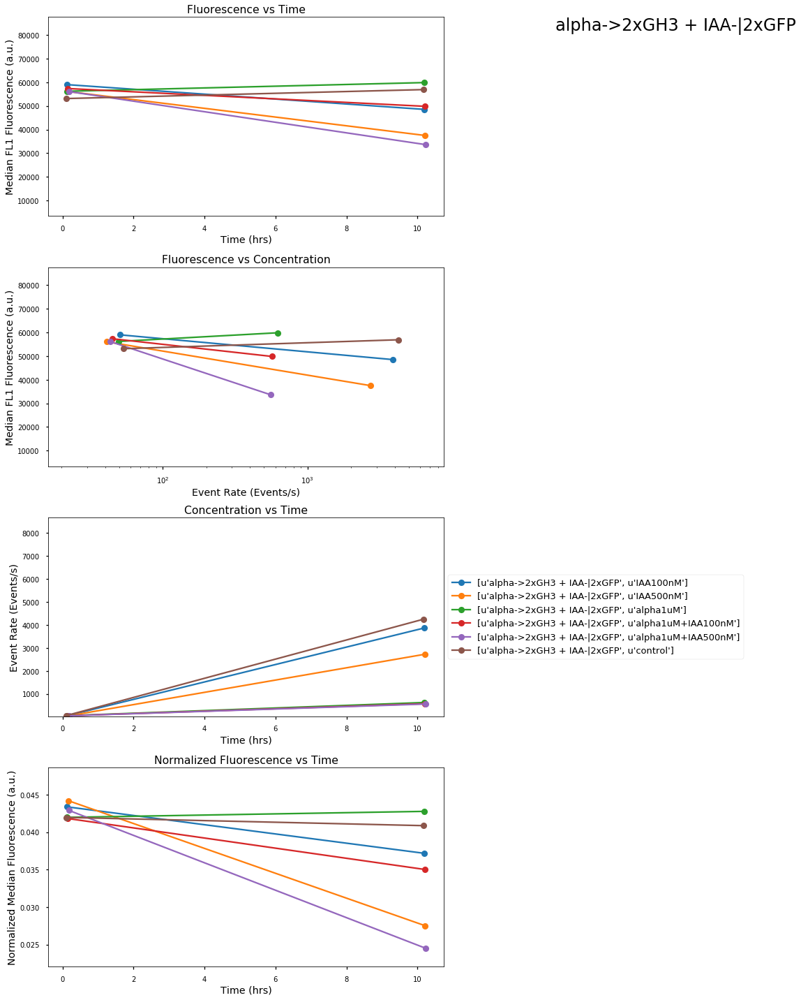

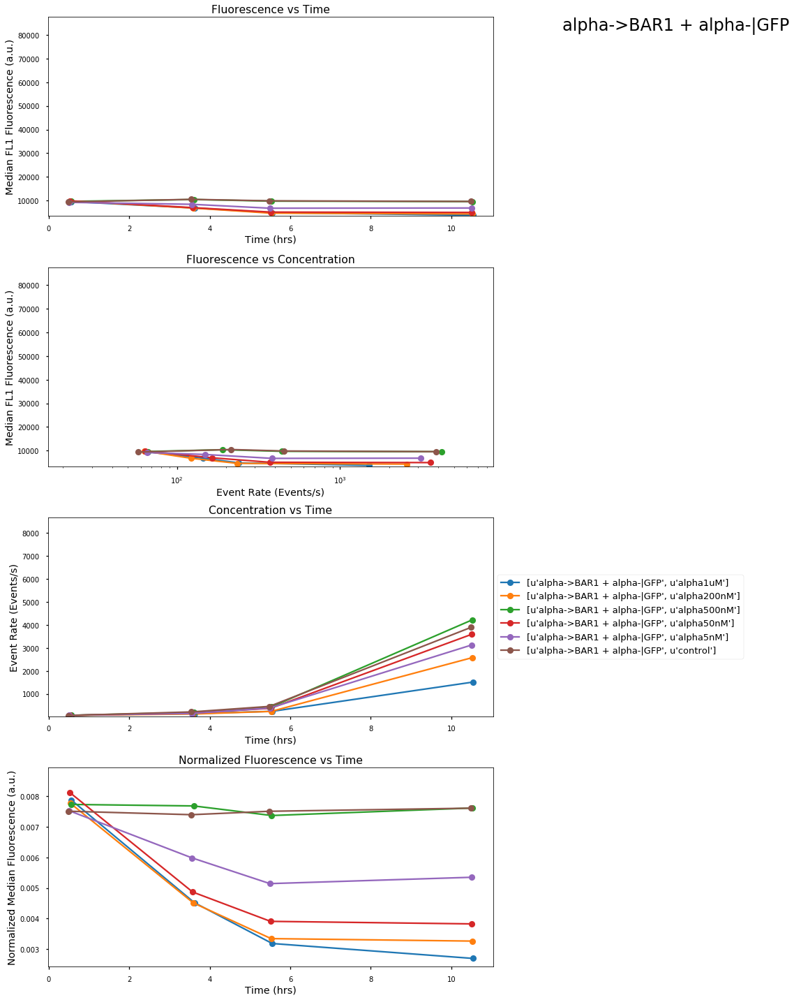

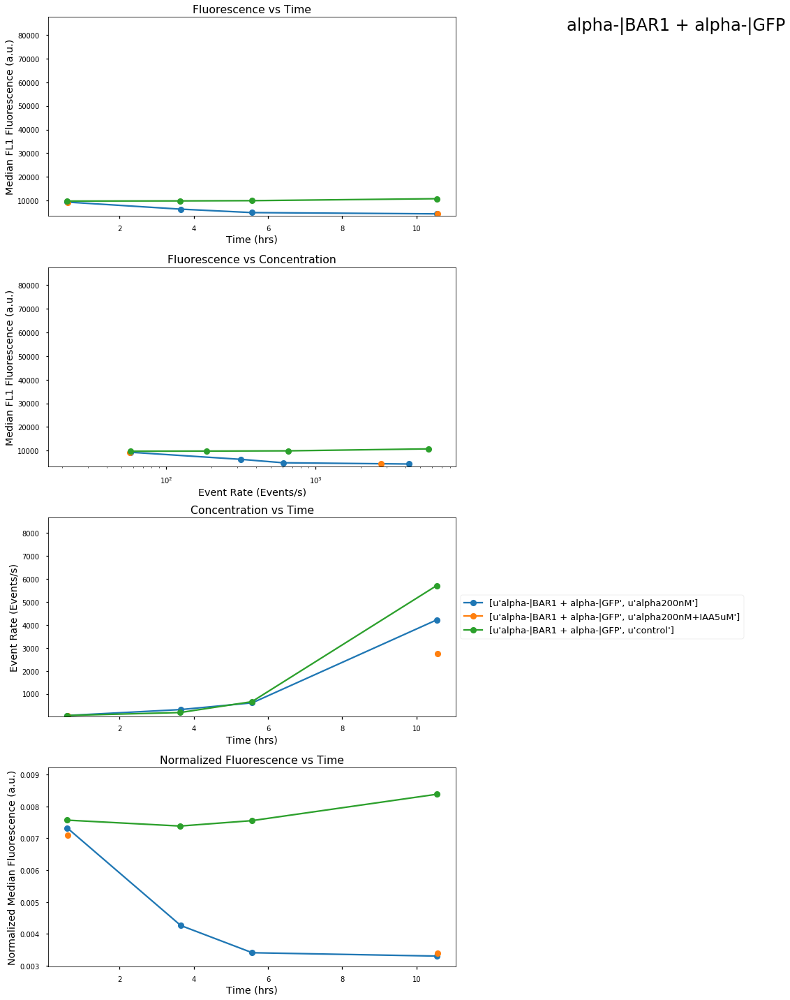

...

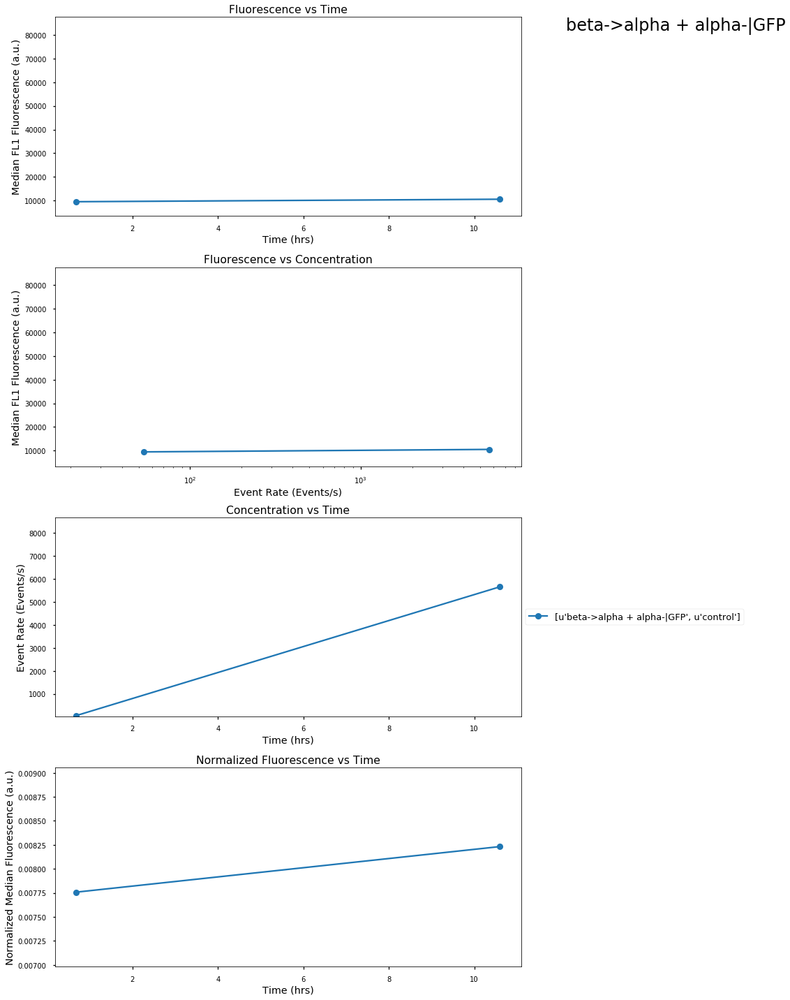

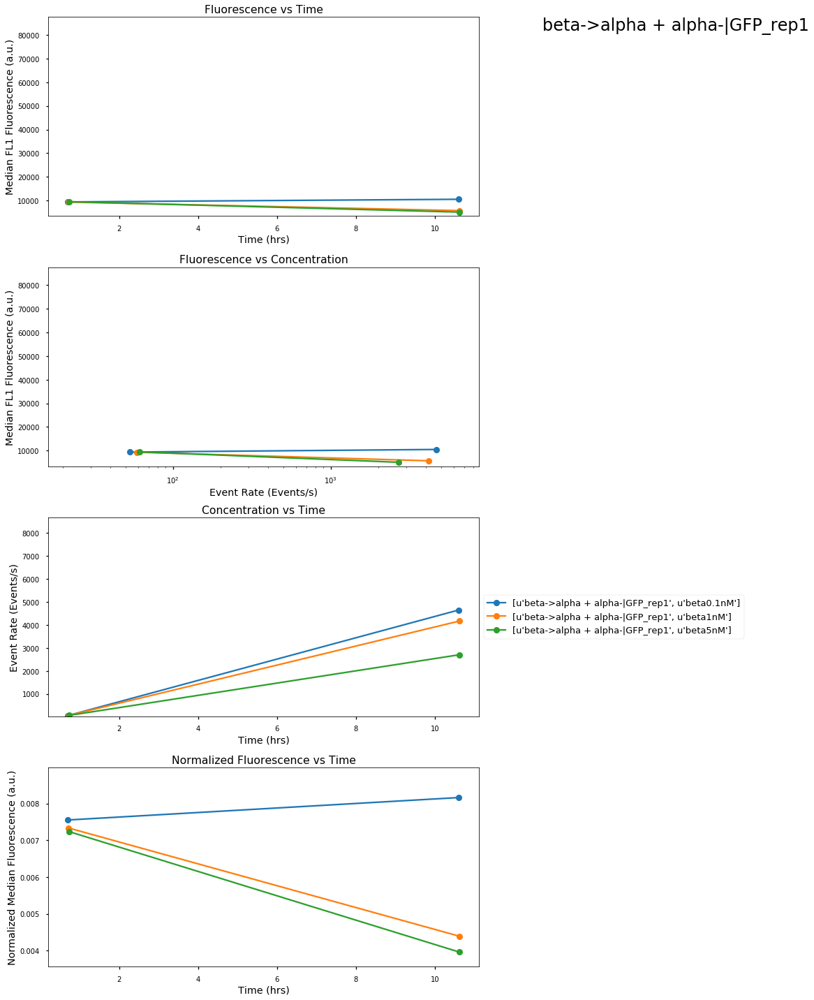

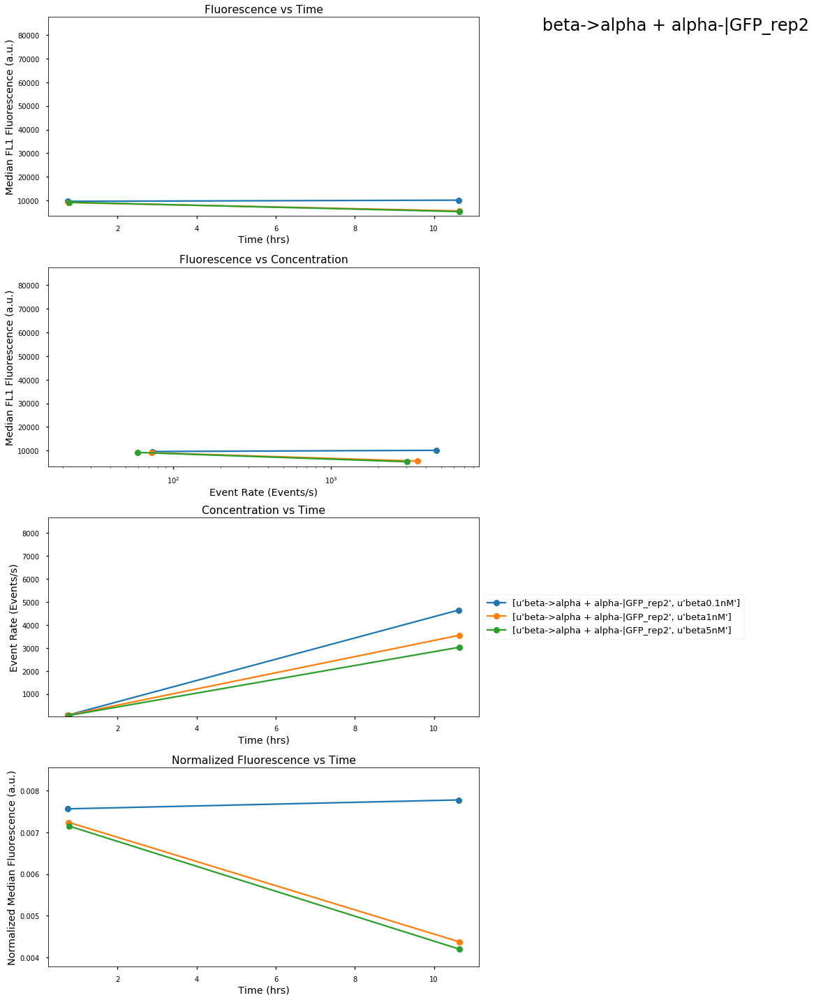

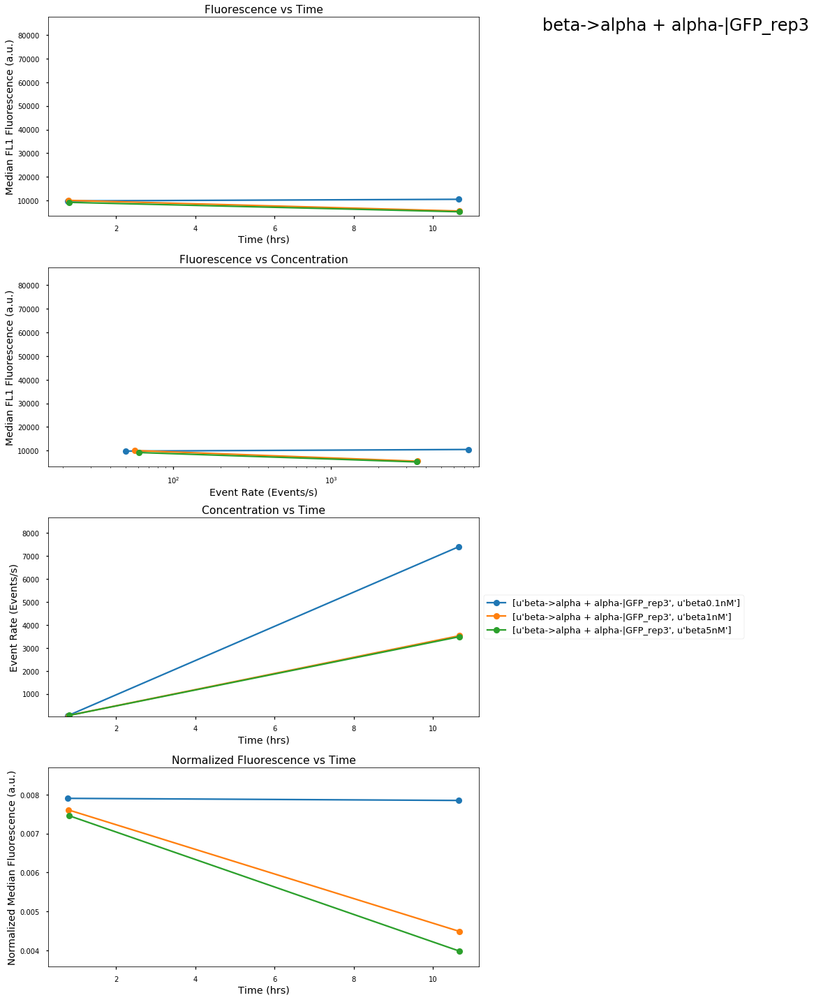

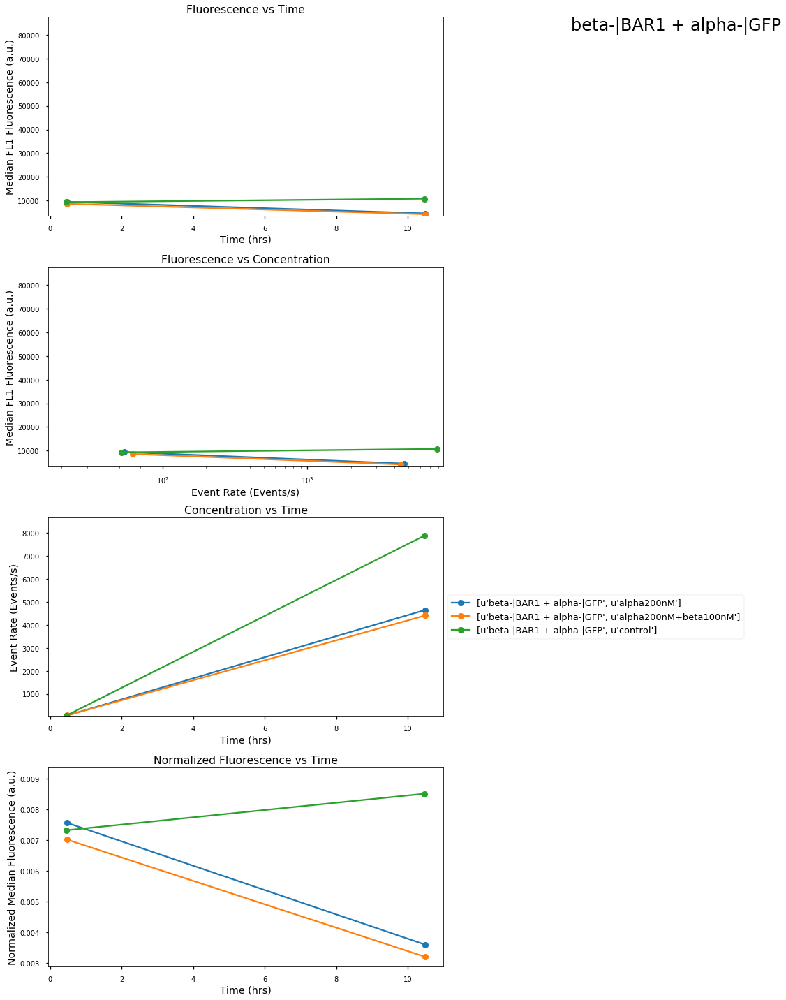

In [17]:
pdf = PdfPages('20-08-13_MoreData2.pdf')


for index,df in mapped.groupby(level=[0]):

    fl1_lims = [0.9*min(mapped['Median FL1-A']),1.1*max(mapped['Median FL1-A'])]
    evs_lims = [0.9*min(mapped['Event Rate']),1.1*max(mapped['Event Rate'])]
    norm_lims = [0.9*min(df['Normalized Median Fluorescence']),1.1*max(df['Normalized Median Fluorescence'])]
    fig = plt.figure(figsize=(15,20))
    st = fig.suptitle(index, fontsize=24)
    st.set_x(0.9)
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,2,sharey=ax1)
    ax3 = fig.add_subplot(4,1,3)
    ax4 = fig.add_subplot(4,1,4)
    for index2,df2 in df.groupby(level=[1]):
        x=df2['Event Rate'].values
        y=df2['Median FL1-A'].values
        n = df2['Normalized Median Fluorescence'].values
        t =df2['Time'].values
        ax1.plot(t,y,marker='o')
        ax2.plot(x,y,marker='o')
        ax3.plot(t,x,marker='o',label=[index,index2])
        ax4.plot(t,n,marker='o')

    ax1.set_ylim(fl1_lims)
    ax2.set_xlim(evs_lims)
    ax2.set_xscale('log')

    ax3.set_ylim(evs_lims)
    ax4.set_ylim(norm_lims)

    ax1.set_title('Fluorescence vs Time')
    ax1.set_xlabel('Time (hrs)')
    ax1.set_ylabel('Median FL1 Fluorescence (a.u.)')
    
    ax2.set_title('Fluorescence vs Concentration')
    ax2.set_xlabel('Event Rate (Events/s)')
    ax2.set_ylabel('Median FL1 Fluorescence (a.u.)')

    ax3.set_title('Concentration vs Time')
    ax3.set_xlabel('Time (hrs)')
    ax3.set_ylabel('Event Rate (Events/s)')
    
    ax4.set_title('Normalized Fluorescence vs Time')
    ax4.set_xlabel('Time (hrs)')
    ax4.set_ylabel('Normalized Median Fluorescence (a.u.)')
    
    ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    fig.tight_layout()
    pdf.savefig()
pdf.close()

In [18]:
mapped.to_csv('20-08-13_MoreData2.csv')

In [19]:
#No gating on the concentration

In [20]:
#Calculate parameter data
gate = fl1_threshold
#gate = fsc_ssc_threshold
fl1 = analyze(data,median_FL1,gate=gate)
conc = analyze(data,event_rate)
time = analyze(data,abs_time,gate=gate)
#fl1 = analyze(data,median_FL1)
#conc = analyze(data,event_rate)
#time = analyze(data,abs_time)
normalized_fl1 = analyze(data, normalize, gate=gate)
conc

[          1          2          3          4          5          6   \
 A  29.800363  22.600733  24.542079  24.266338  22.877960  24.484629   
 B  51.818182  45.163636  47.992937  52.472727  47.527273  47.688504   
 C  51.992687  54.232836  61.886336  57.533253  65.430874  63.652174   
 D  52.829721  52.610837  55.149254  50.906832  53.740085  53.558504   
 E  57.481203  60.644753  30.997442  30.436364  30.954955  27.927273   
 F        NaN        NaN        NaN        NaN        NaN        NaN   
 G        NaN        NaN        NaN        NaN        NaN        NaN   
 H        NaN        NaN        NaN        NaN        NaN        NaN   
 
           7          8          9          10         11         12  
 A  25.353160  23.992560  21.404806  20.921053  18.029197  44.727273  
 B  53.345455  49.527273  50.652174  44.770642  41.052632  43.686806  
 C  62.945455  66.457074  64.870849  57.963636  57.752266  56.893438  
 D  59.330855  61.423221  73.700495  72.889447  59.814011  50.1090

In [21]:
#Map Data to Identifier as MultiIndex
mapped = map_data(platemap,{'Median FL1-A':fl1, 'Normalized Median Fluorescence': normalized_fl1, 'Event Rate':conc,'Time':time},['Strain','Treatment','t'])

mapped['Time'] -= min(mapped['Time'])
mapped

Normalized Median Fluorescence  \
Strain                        Treatment             t                                     
IAA->alpha(ZAVN) + alpha-|GFP IAA10uM               0.0                        0.007713   
                                                    1.0                        0.007752   
                              IAA500nM              0.0                        0.007500   
                                                    1.0                        0.007598   
                              IAA5uM                0.0                        0.007713   
                                                    1.0                        0.007450   
                              control               0.0                        0.007477   
                                                    1.0                        0.007358   
IAA-|2xGFP                    IAA500nM              0.0                        0.056701   
                                                    1.0                        0.028970   
                              IAA500nM+auxinol100uM 0.0                        0.056139   
                                                    1.0                        0.034313   
                              IAA500nM+auxinol10uM  0.0                        0.057713   
                                                    1.0                        0.029663   
                              IAA500nM+auxinol50uM  0.0                        0.056889   
                                                    1.0                        0.032010   
                              IAA5uM                0.0                        0.057530   
                                                    1.0                        0.014601   
                              control               0.0                        0.058184   
                                                    1.0                        0.040027   
alpha->2xGH3 + IAA-|2xGFP     IAA100nM              0.0                        0.039829   
                                                    1.0                        0.027016   
                              IAA500nM              0.0                        0.039697   
                                                    1.0                        0.019078   
                              alpha1uM              0.0                        0.039240   
                                                    1.0                        0.031114   
                              alpha1uM+IAA100nM     0.0                        0.039634   
                                                    1.0                        0.026238   
                              alpha1uM+IAA500nM     0.0                        0.041030   
                                                    1.0                        0.018171   
...                                                                                 ...   
beta->IAA + IAA-|2xGFP_rep3   IAM300uM+beta1nM      0.0                        0.039496   
                                                    1.0                        0.017751   
                              IAM300uM+beta5nM      0.0                        0.039321   
                                                    1.0                        0.016291   
beta->alpha + alpha-|GFP      control               0.0                        0.006828   
                                                    1.0                        0.007133   
beta->alpha + alpha-|GFP_rep1 beta0.1nM             0.0                        0.006932   
                                                    1.0                        0.006748   
                              beta1nM               0.0                        0.007024   
                                                    1.0                        0.003823   
                              beta5nM               0.0                        0.007029   
                                                    1

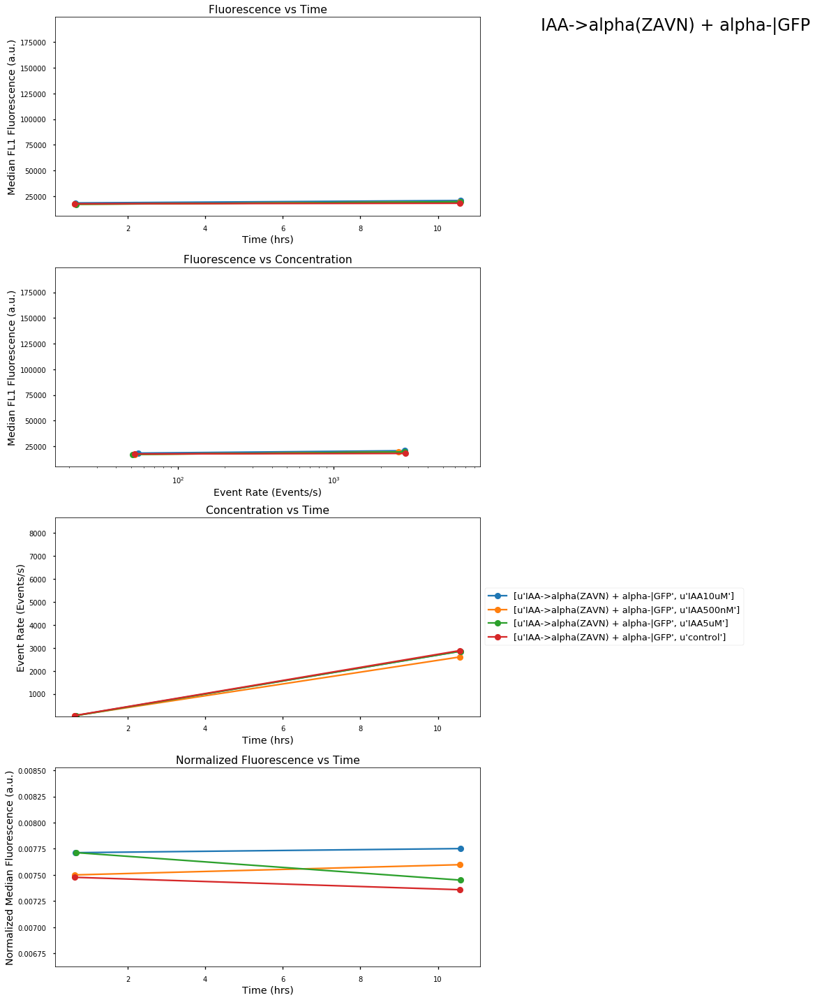

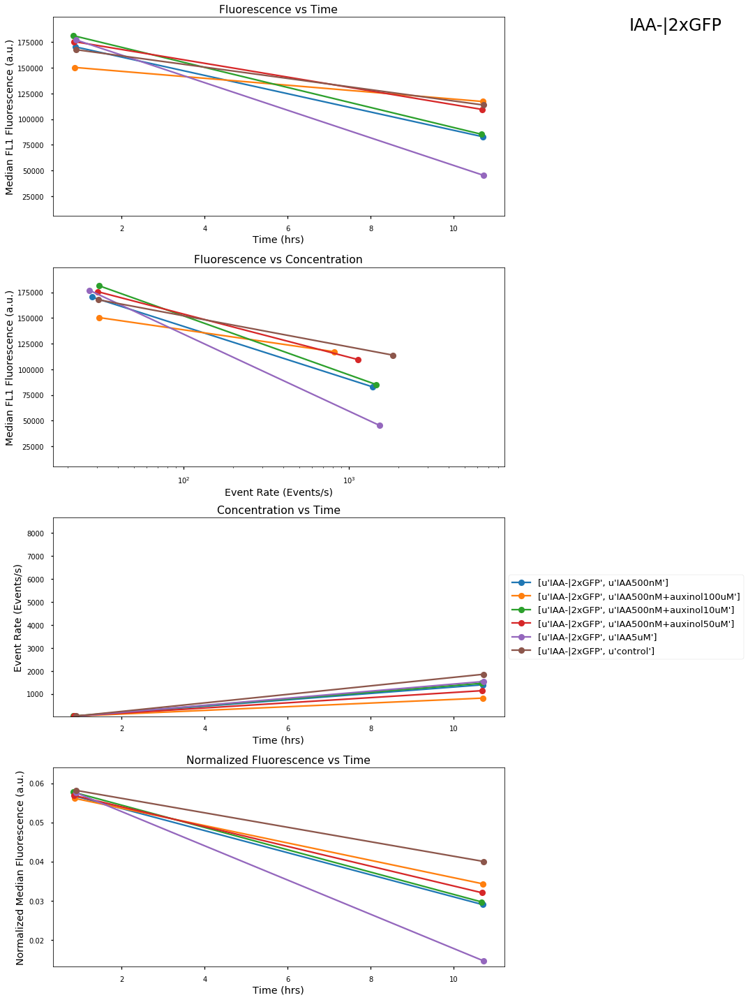

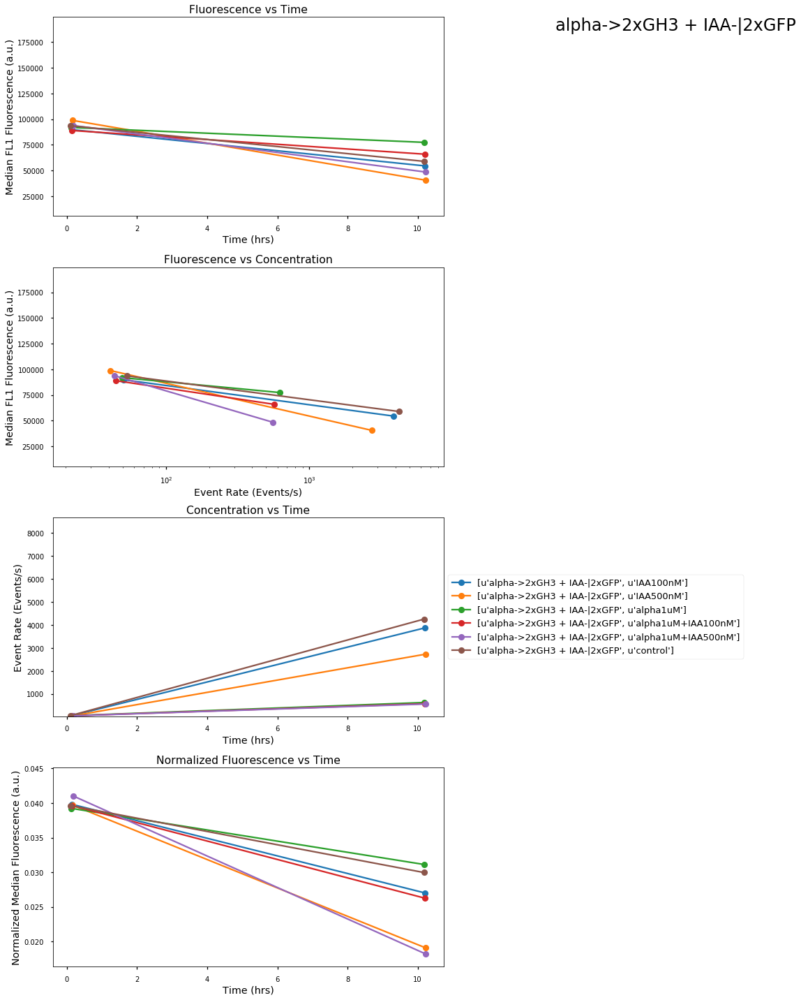

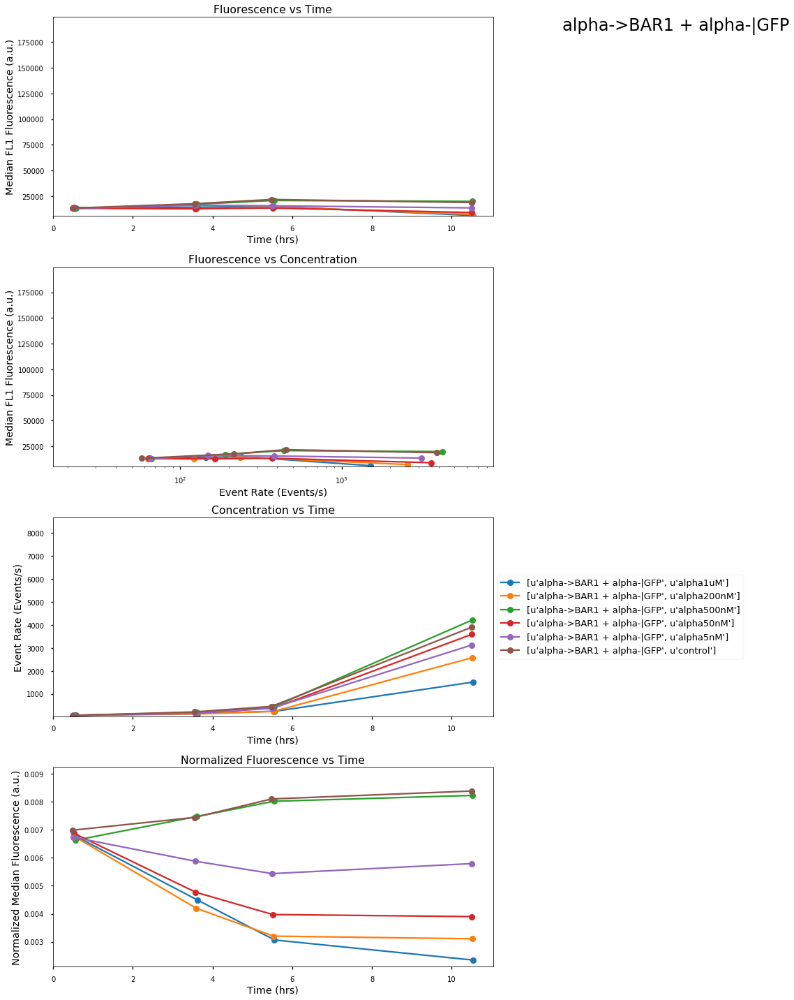

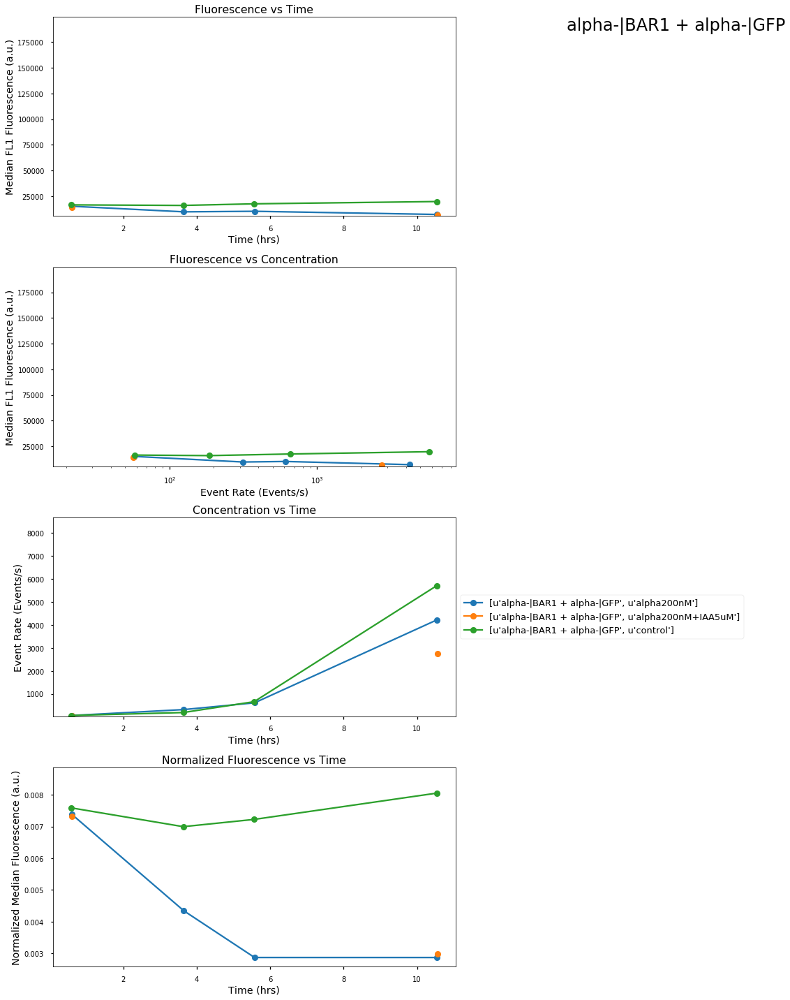

...

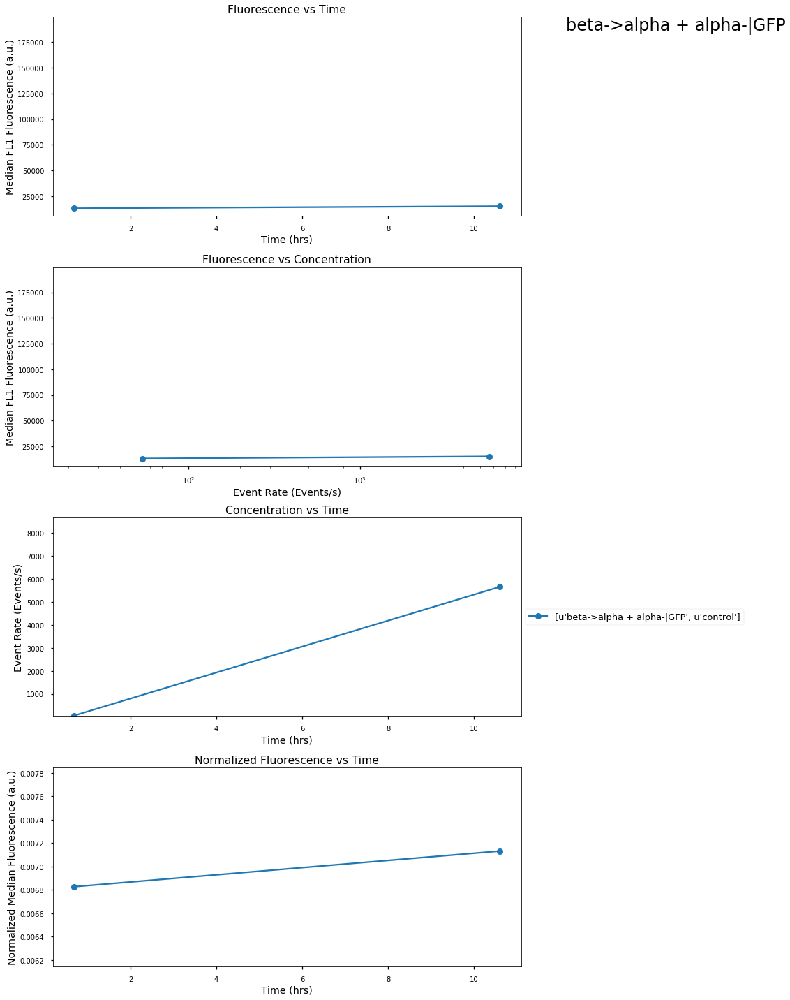

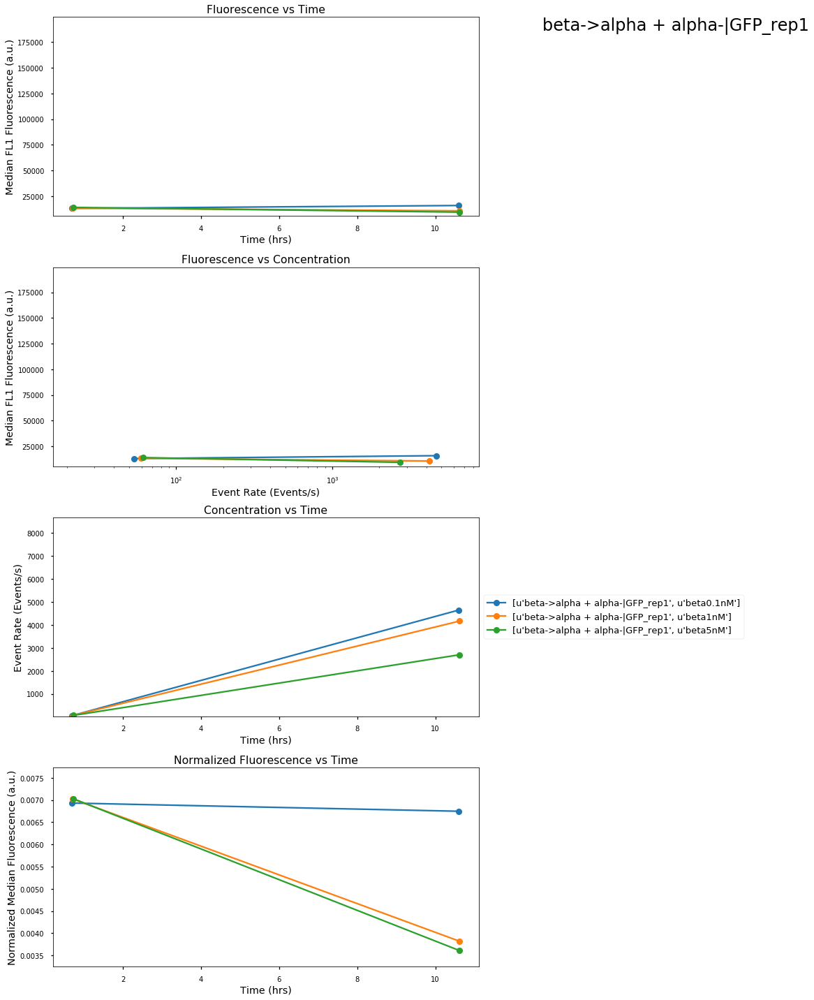

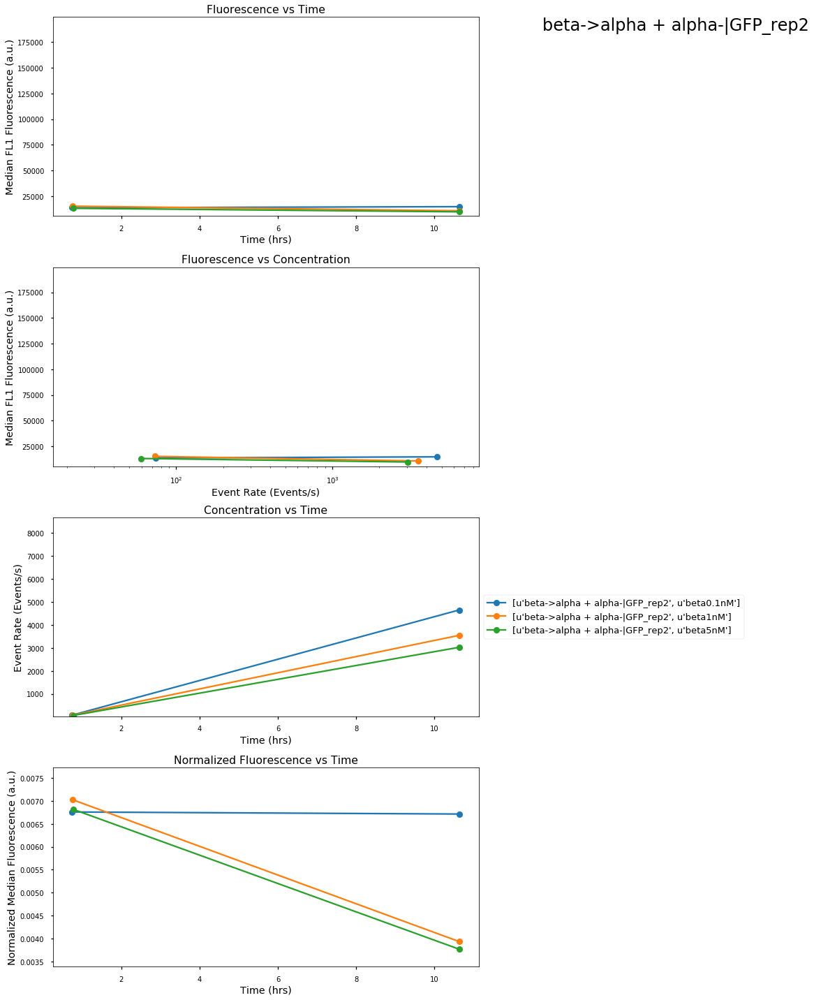

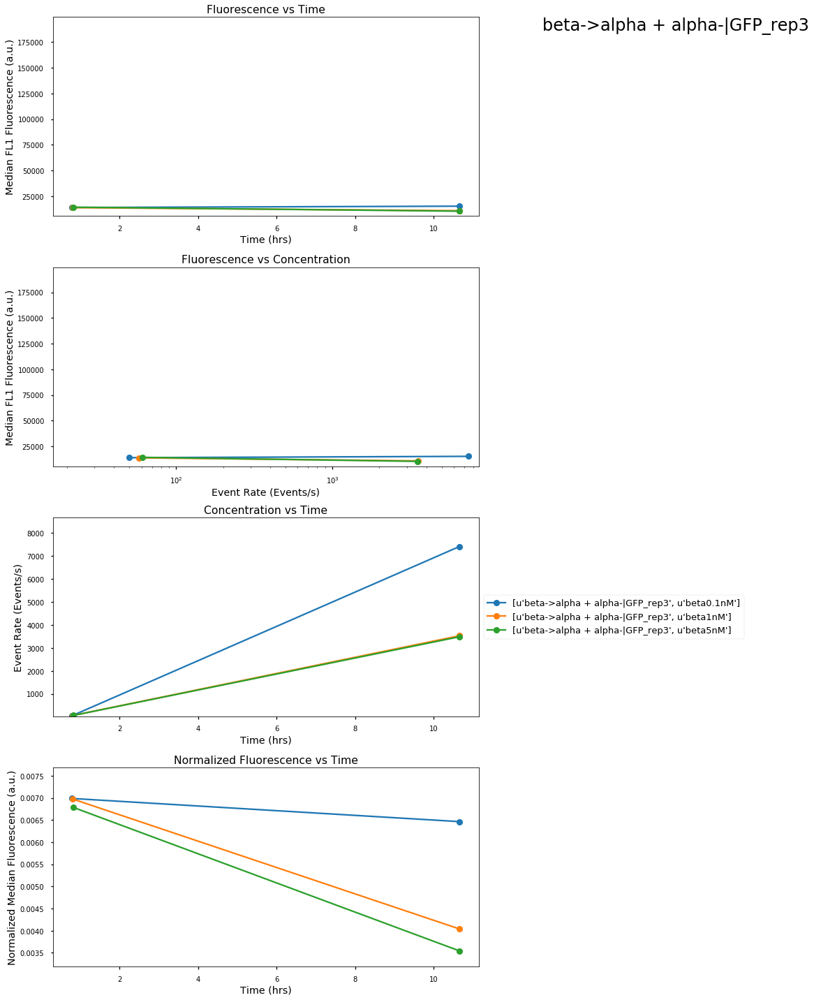

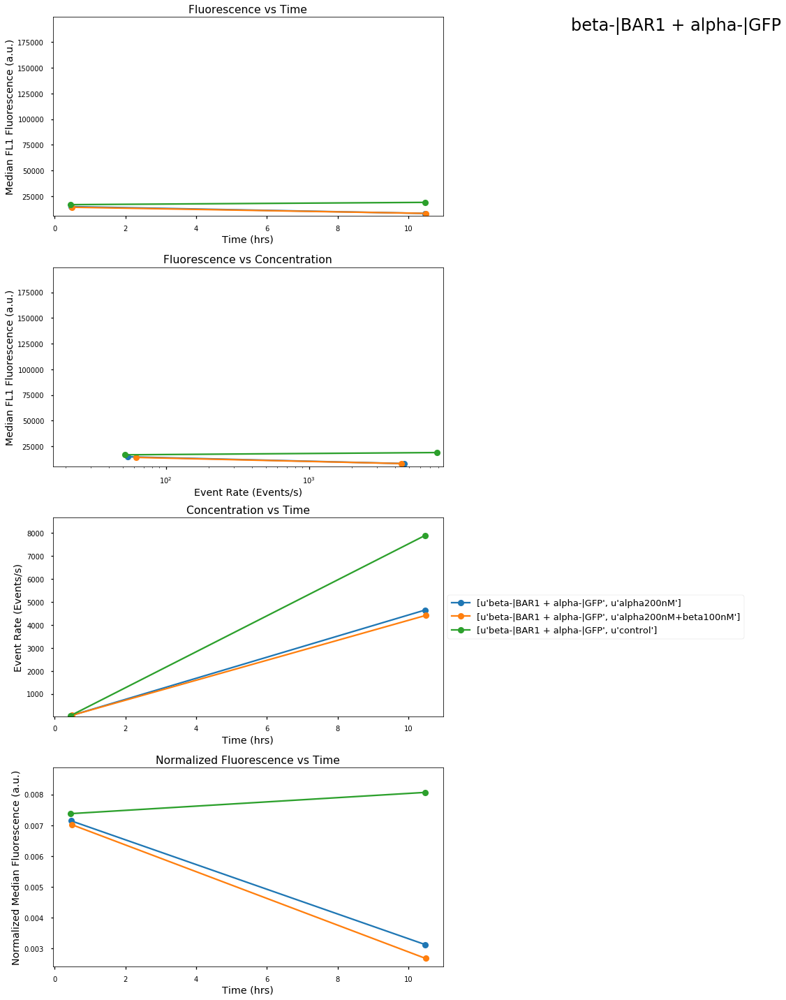

In [22]:
pdf = PdfPages('20-08-13_MoreData2NoGate.pdf')
fl1_lims = [0.9*min(mapped['Median FL1-A']),1.1*max(mapped['Median FL1-A'])]
evs_lims = [0.9*min(mapped['Event Rate']),1.1*max(mapped['Event Rate'])]

for index,df in mapped.groupby(level=[0]):

    fl1_lims = [0.9*min(mapped['Median FL1-A']),1.1*max(mapped['Median FL1-A'])]
    evs_lims = [0.9*min(mapped['Event Rate']),1.1*max(mapped['Event Rate'])]
    norm_lims = [0.9*min(df['Normalized Median Fluorescence']),1.1*max(df['Normalized Median Fluorescence'])]
    fig = plt.figure(figsize=(15,20))
    st = fig.suptitle(index, fontsize=24)
    st.set_x(0.9)
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,2,sharey=ax1)
    ax3 = fig.add_subplot(4,1,3)
    ax4 = fig.add_subplot(4,1,4)
    for index2,df2 in df.groupby(level=[1]):
        x=df2['Event Rate'].values
        y=df2['Median FL1-A'].values
        n = df2['Normalized Median Fluorescence'].values
        t =df2['Time'].values
        ax1.plot(t,y,marker='o')
        ax2.plot(x,y,marker='o')
        ax3.plot(t,x,marker='o',label=[index,index2])
        ax4.plot(t,n,marker='o')

    ax1.set_ylim(fl1_lims)
    ax2.set_xlim(evs_lims)
    ax2.set_xscale('log')

    ax3.set_ylim(evs_lims)
    ax4.set_ylim(norm_lims)

    ax1.set_title('Fluorescence vs Time')
    ax1.set_xlabel('Time (hrs)')
    ax1.set_ylabel('Median FL1 Fluorescence (a.u.)')
    
    ax2.set_title('Fluorescence vs Concentration')
    ax2.set_xlabel('Event Rate (Events/s)')
    ax2.set_ylabel('Median FL1 Fluorescence (a.u.)')

    ax3.set_title('Concentration vs Time')
    ax3.set_xlabel('Time (hrs)')
    ax3.set_ylabel('Event Rate (Events/s)')
    
    ax4.set_title('Normalized Fluorescence vs Time')
    ax4.set_xlabel('Time (hrs)')
    ax4.set_ylabel('Normalized Median Fluorescence (a.u.)')
    
    ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    fig.tight_layout()
    pdf.savefig()
pdf.close()

In [23]:
mapped.to_csv('20-08-13_MoreData2NoGate.csv')

In [24]:
#Smaller gates

In [25]:
fsc_ssc_gate=PolyGate([(9.078e+05, 7.286e+04), (1.468e+06, 5.722e+04), (2.188e+06, 1.276e+05), (2.236e+06, 2.273e+05), (1.500e+06, 2.215e+05), (8.358e+05, 1.100e+05), (9.078e+05, 7.286e+04), (9.078e+05, 7.286e+04)], ('FSC-H', 'SSC-A'), region='in', name='gate1')
# PolyGate([(8.133e+05, 9.116e+04), (9.293e+05, 2.085e+05), (1.652e+06, 2.008e+05), (1.458e+06, 8.346e+04), (8.262e+05, 8.346e+04)], ('FSC-H', 'SSC-A'), region='in', name='gate1')
fsc_ssc_threshold = fsc_ssc_gate
fl1_gate = set_gates(channels = ['FL1-A'],limits =[(3000,5*10**7)],gates={})
fl1_threshold = get_threshold('FL1-A',fl1_gate)

In [26]:
#Calculate parameter data
gate = fsc_ssc_threshold&fl1_threshold
#gate = fsc_ssc_threshold
fl1 = analyze(data,median_FL1,gate=gate)
#conc = analyze(data,event_rate,gate=gate)
time = analyze(data,abs_time,gate=gate)
#fl1 = analyze(data,median_FL1)
conc = analyze(data,event_rate)
normalized_fl1 = analyze(data, normalize, gate=gate)
#time = analyze(data,abs_time)
conc

[          1          2          3          4          5          6   \
 A  29.800363  22.600733  24.542079  24.266338  22.877960  24.484629   
 B  51.818182  45.163636  47.992937  52.472727  47.527273  47.688504   
 C  51.992687  54.232836  61.886336  57.533253  65.430874  63.652174   
 D  52.829721  52.610837  55.149254  50.906832  53.740085  53.558504   
 E  57.481203  60.644753  30.997442  30.436364  30.954955  27.927273   
 F        NaN        NaN        NaN        NaN        NaN        NaN   
 G        NaN        NaN        NaN        NaN        NaN        NaN   
 H        NaN        NaN        NaN        NaN        NaN        NaN   
 
           7          8          9          10         11         12  
 A  25.353160  23.992560  21.404806  20.921053  18.029197  44.727273  
 B  53.345455  49.527273  50.652174  44.770642  41.052632  43.686806  
 C  62.945455  66.457074  64.870849  57.963636  57.752266  56.893438  
 D  59.330855  61.423221  73.700495  72.889447  59.814011  50.1090

In [27]:
#Map Data to Identifier as MultiIndex
mapped = map_data(platemap,{'Median FL1-A':fl1, 'Normalized Median Fluorescence': normalized_fl1, 'Event Rate':conc,'Time':time},['Strain','Treatment','t'])

mapped['Time'] -= min(mapped['Time'])
mapped

Normalized Median Fluorescence  \
Strain                        Treatment             t                                     
IAA->alpha(ZAVN) + alpha-|GFP IAA10uM               0.0                        0.007301   
                                                    1.0                        0.006557   
                              IAA500nM              0.0                        0.007523   
                                                    1.0                        0.006636   
                              IAA5uM                0.0                        0.007375   
                                                    1.0                        0.006498   
                              control               0.0                        0.007302   
                                                    1.0                        0.006502   
IAA-|2xGFP                    IAA500nM              0.0                        0.051298   
                                                    1.0                        0.027456   
                              IAA500nM+auxinol100uM 0.0                        0.050198   
                                                    1.0                        0.031731   
                              IAA500nM+auxinol10uM  0.0                        0.052915   
                                                    1.0                        0.027917   
                              IAA500nM+auxinol50uM  0.0                        0.051143   
                                                    1.0                        0.029747   
                              IAA5uM                0.0                        0.053736   
                                                    1.0                        0.013305   
                              control               0.0                        0.052943   
                                                    1.0                        0.037451   
alpha->2xGH3 + IAA-|2xGFP     IAA100nM              0.0                        0.039833   
                                                    1.0                        0.034126   
                              IAA500nM              0.0                        0.039854   
                                                    1.0                        0.025705   
                              alpha1uM              0.0                        0.037511   
                                                    1.0                        0.039625   
                              alpha1uM+IAA100nM     0.0                        0.039920   
                                                    1.0                        0.034310   
                              alpha1uM+IAA500nM     0.0                        0.038967   
                                                    1.0                        0.023512   
...                                                                                 ...   
beta->IAA + IAA-|2xGFP_rep3   IAM300uM+beta1nM      0.0                        0.039196   
                                                    1.0                        0.028788   
                              IAM300uM+beta5nM      0.0                        0.038705   
                                                    1.0                        0.026489   
beta->alpha + alpha-|GFP      control               0.0                        0.007804   
                                                    1.0                        0.007660   
beta->alpha + alpha-|GFP_rep1 beta0.1nM             0.0                        0.007468   
                                                    1.0                        0.007784   
                              beta1nM               0.0                        0.007377   
                                                    1.0                        0.004170   
                              beta5nM               0.0                        0.007354   
                                                    1

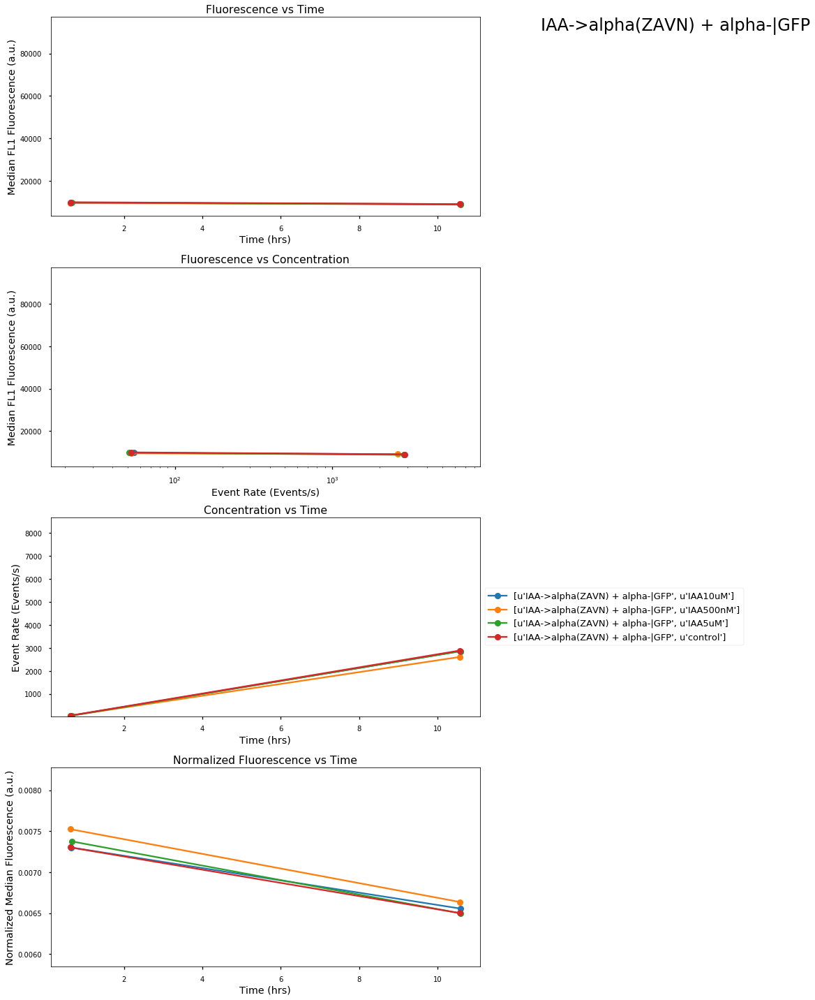

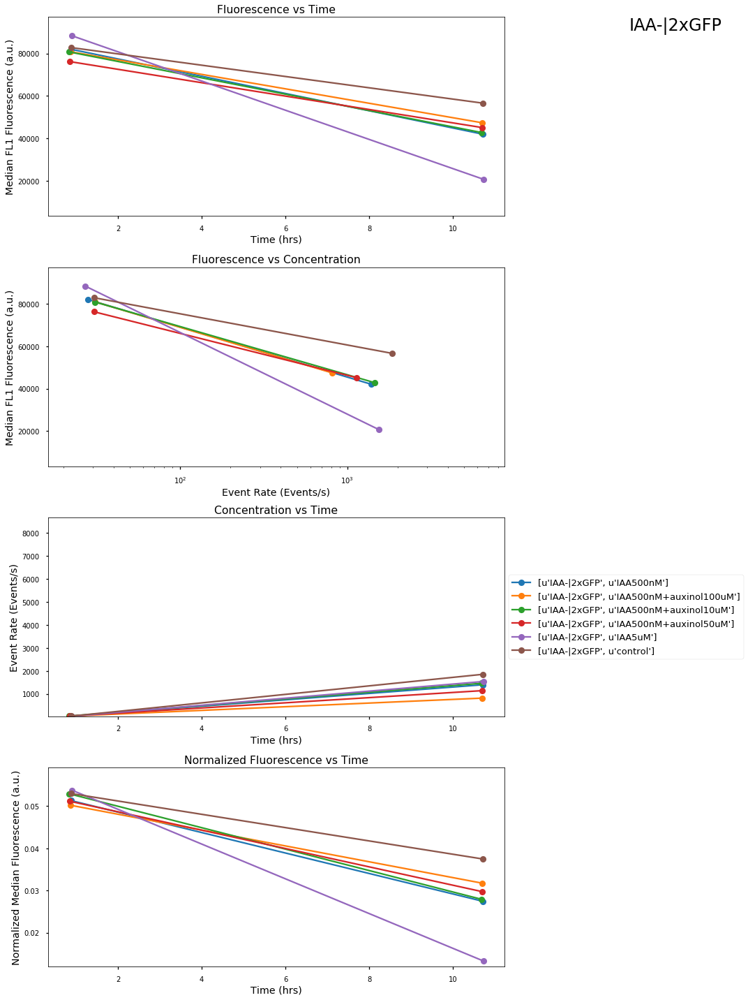

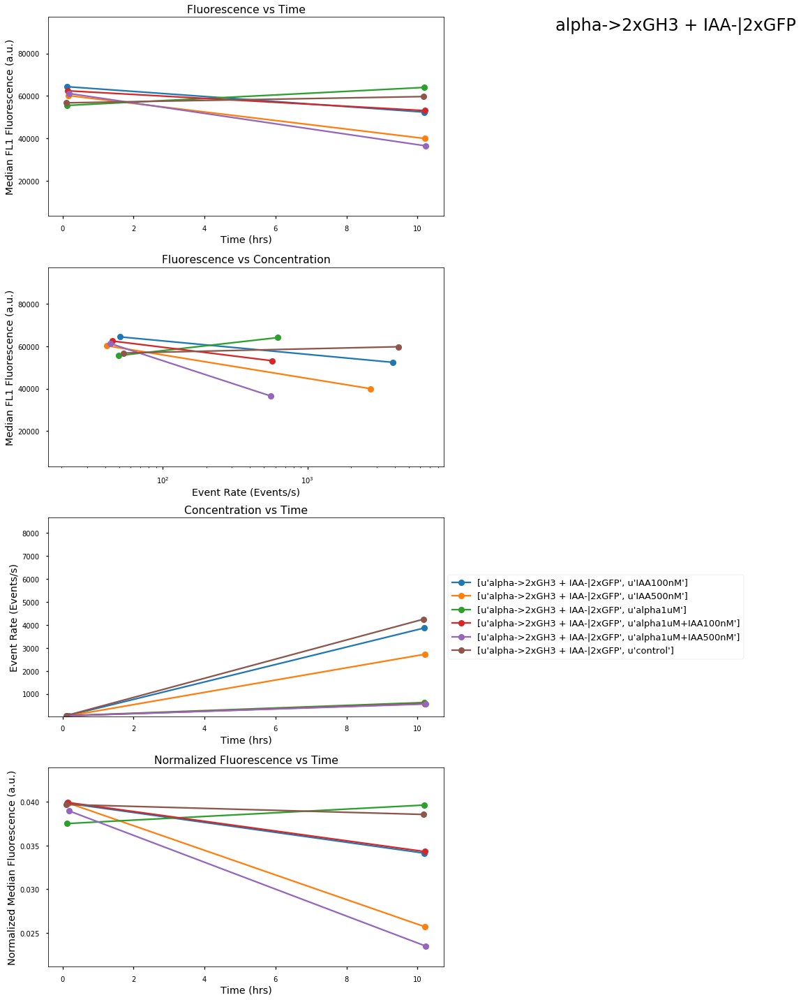

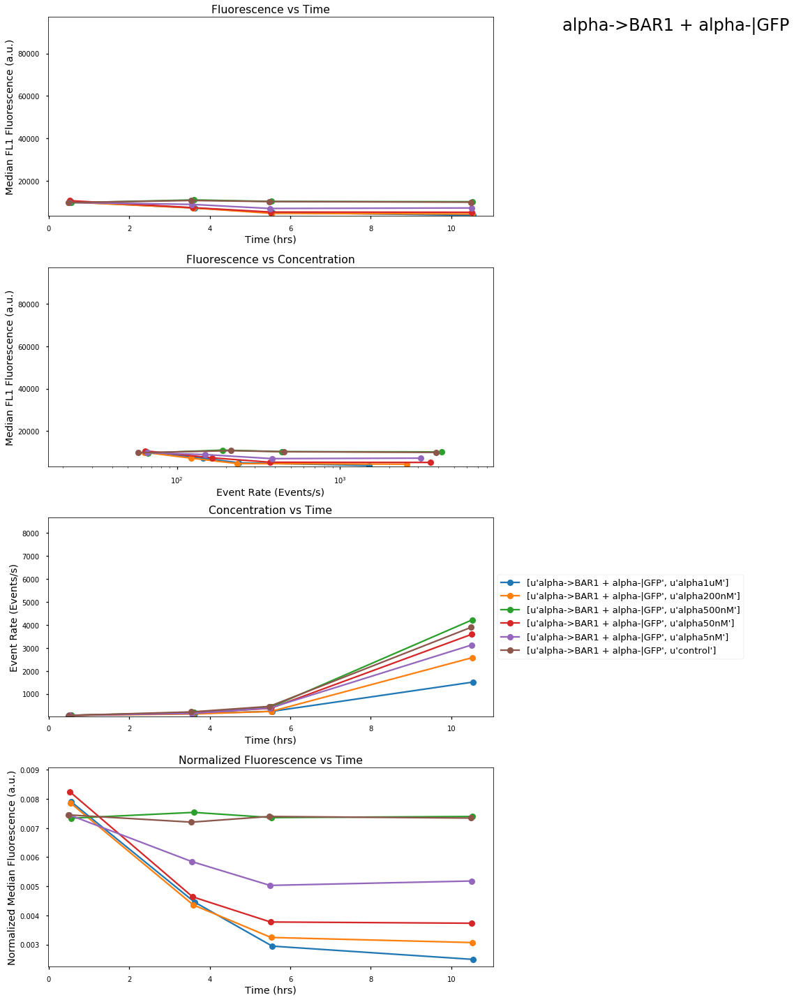

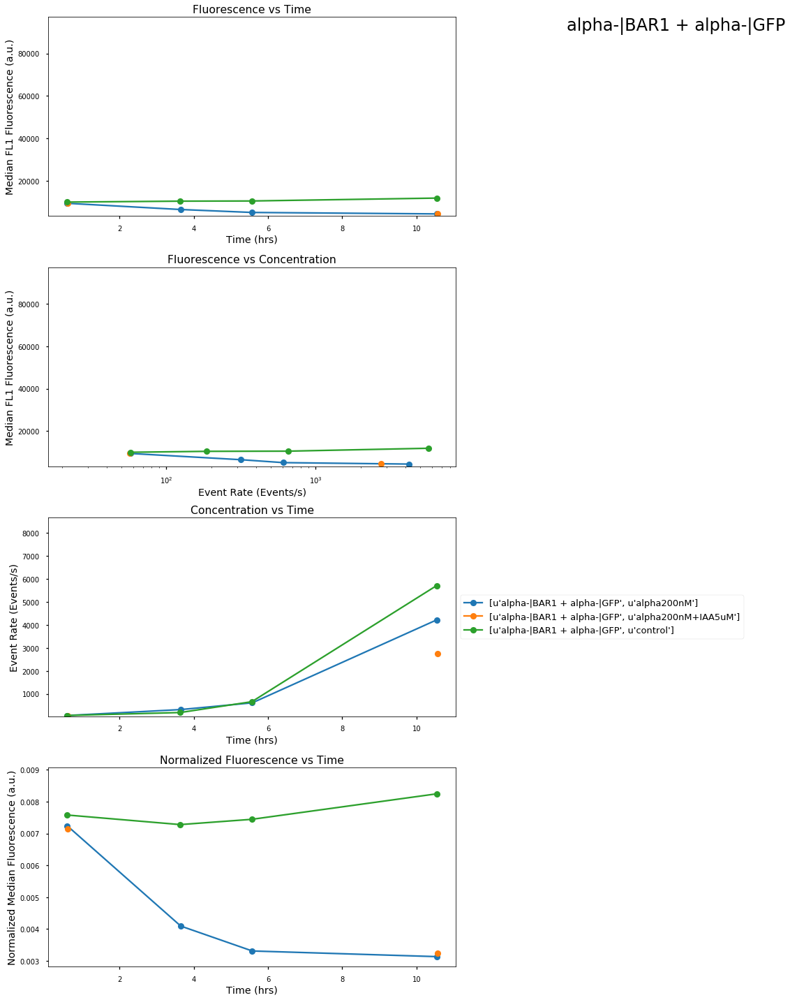

...

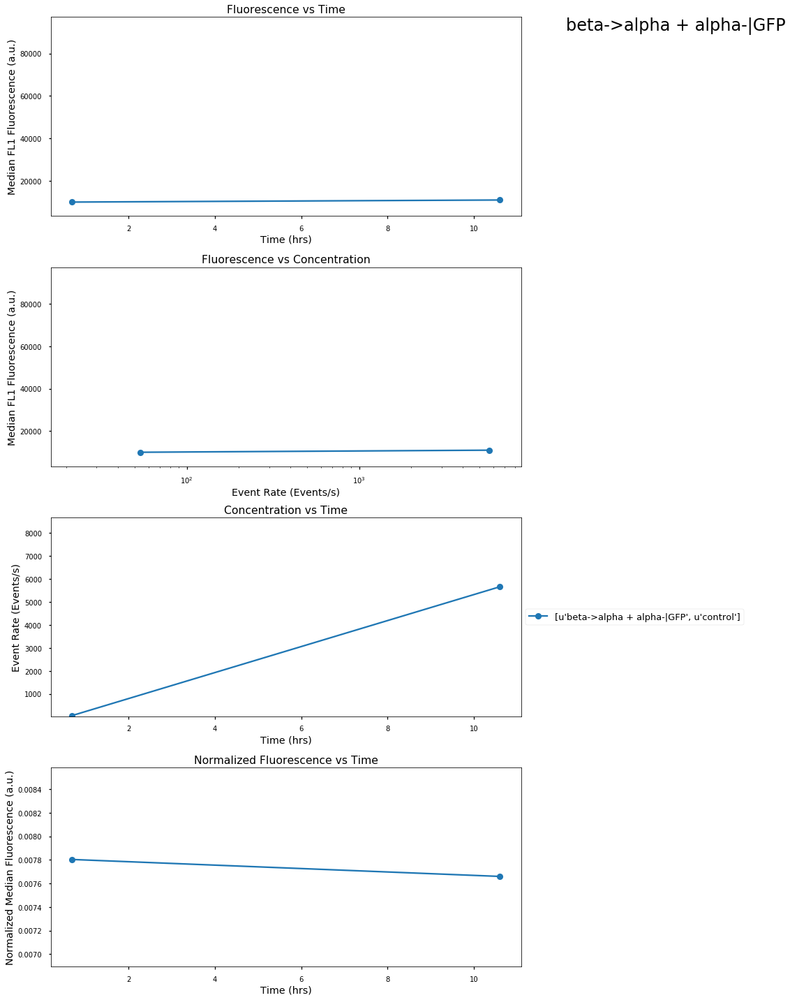

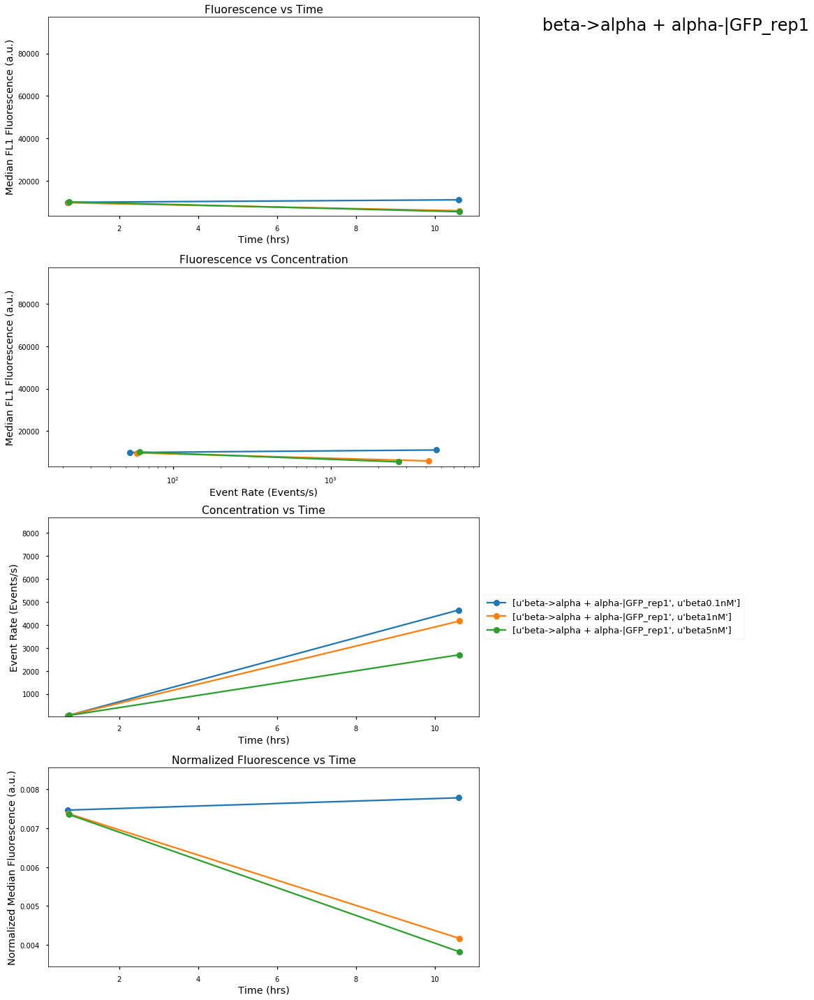

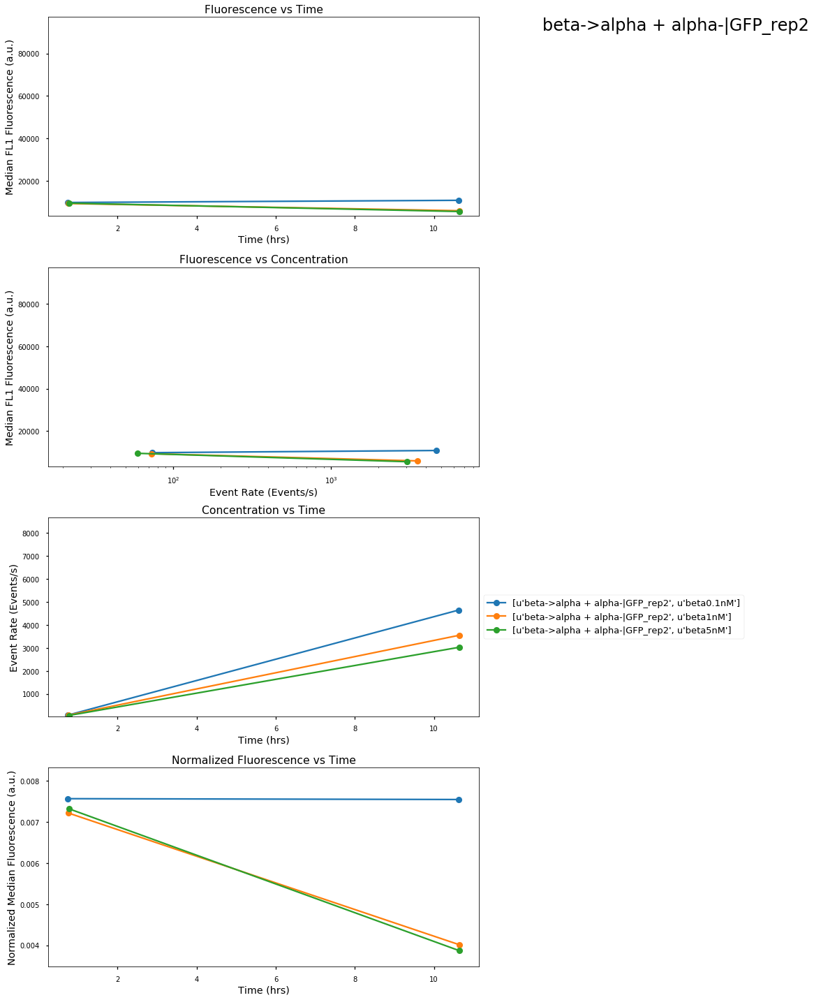

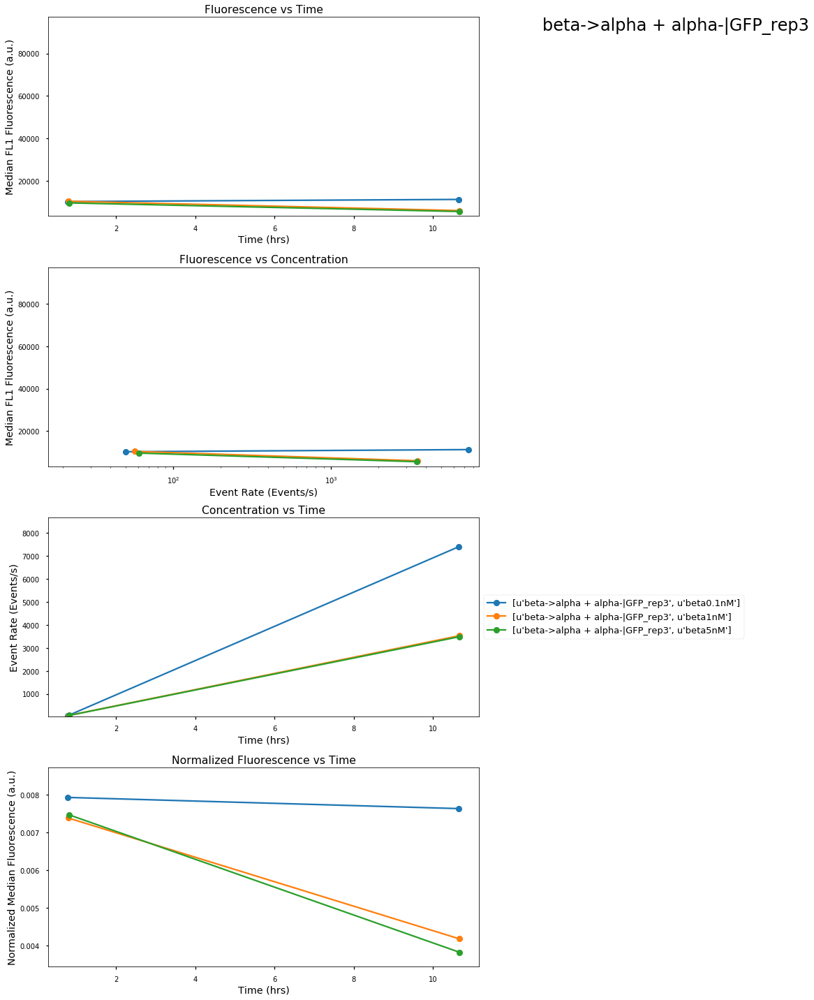

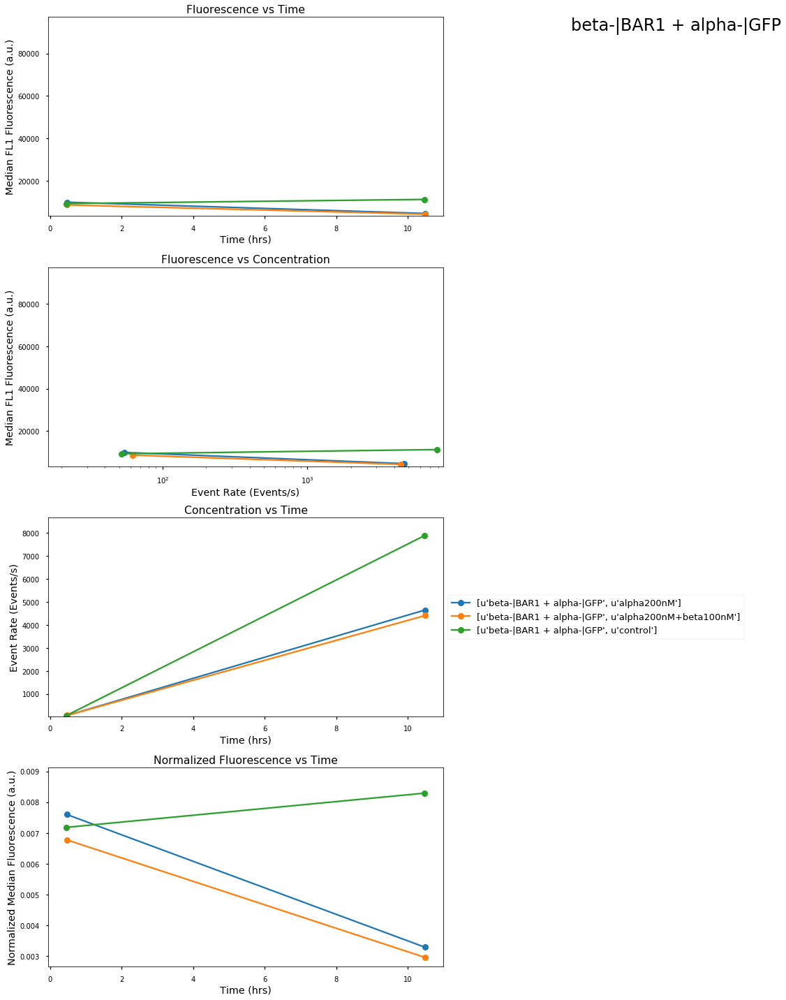

In [28]:
pdf = PdfPages('20-08-13_MoreData2SmallGate.pdf')
fl1_lims = [0.9*min(mapped['Median FL1-A']),1.1*max(mapped['Median FL1-A'])]
evs_lims = [0.9*min(mapped['Event Rate']),1.1*max(mapped['Event Rate'])]

for index,df in mapped.groupby(level=[0]):

    fl1_lims = [0.9*min(mapped['Median FL1-A']),1.1*max(mapped['Median FL1-A'])]
    evs_lims = [0.9*min(mapped['Event Rate']),1.1*max(mapped['Event Rate'])]
    norm_lims = [0.9*min(df['Normalized Median Fluorescence']),1.1*max(df['Normalized Median Fluorescence'])]
    fig = plt.figure(figsize=(15,20))
    st = fig.suptitle(index, fontsize=24)
    st.set_x(0.9)
    ax1 = fig.add_subplot(4,1,1)
    ax2 = fig.add_subplot(4,1,2,sharey=ax1)
    ax3 = fig.add_subplot(4,1,3)
    ax4 = fig.add_subplot(4,1,4)
    for index2,df2 in df.groupby(level=[1]):
        x=df2['Event Rate'].values
        y=df2['Median FL1-A'].values
        n = df2['Normalized Median Fluorescence'].values
        t =df2['Time'].values
        ax1.plot(t,y,marker='o')
        ax2.plot(x,y,marker='o')
        ax3.plot(t,x,marker='o',label=[index,index2])
        ax4.plot(t,n,marker='o')

    ax1.set_ylim(fl1_lims)
    ax2.set_xlim(evs_lims)
    ax2.set_xscale('log')

    ax3.set_ylim(evs_lims)
    ax4.set_ylim(norm_lims)

    ax1.set_title('Fluorescence vs Time')
    ax1.set_xlabel('Time (hrs)')
    ax1.set_ylabel('Median FL1 Fluorescence (a.u.)')
    
    ax2.set_title('Fluorescence vs Concentration')
    ax2.set_xlabel('Event Rate (Events/s)')
    ax2.set_ylabel('Median FL1 Fluorescence (a.u.)')

    ax3.set_title('Concentration vs Time')
    ax3.set_xlabel('Time (hrs)')
    ax3.set_ylabel('Event Rate (Events/s)')
    
    ax4.set_title('Normalized Fluorescence vs Time')
    ax4.set_xlabel('Time (hrs)')
    ax4.set_ylabel('Normalized Median Fluorescence (a.u.)')
    
    ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    fig.tight_layout()
    pdf.savefig()
pdf.close()

In [29]:
mapped.to_csv('20-08-13_MoreData2SmallGate.csv')